In [1]:
import pandas as pd
from IPython.display import display, HTML
import warnings
import seaborn as sns
import plotly.express as px
warnings.filterwarnings("ignore", category=FutureWarning) # disable warnings
warnings.filterwarnings("ignore", category= UserWarning)

# You can view the resulting Pandas DataFrame and work with using the Pandas library.
# https://pandas.pydata.org/docs/getting_started/index.html#getting-started
df = pd.read_json("../assets/02_eda_imovirtual.json", lines=True)

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import ast

# Display settings
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
pd.set_option('display.float_format', lambda x: '%.2f' % x)

print(f"Shape before duplicate removal: {df.shape}")
# It was mentioned there are 23 duplicates based on 'id'
# Let's see if these are full row duplicates or just id duplicates
print(f"Number of rows with duplicate 'id' (keeping first): {df.duplicated(subset=['id'], keep='first').sum()}")
print(f"Number of rows with duplicate 'id' (keeping last): {df.duplicated(subset=['id'], keep='last').sum()}")

# Keep the most recent entry based on 'modified_at' or 'created_at' if ids are duplicated
# First, ensure 'id' doesn't have NaNs for sorting, or handle them
df_cleaned = df.copy()
if df_cleaned['id'].isna().any():
    print("Warning: 'id' column contains NaNs. Duplicate removal might be affected.")
    # Option: Fill NaNs with a unique placeholder if necessary, or drop rows with NaN id
    # For now, we'll proceed, but this is a consideration.

# Sort by id and a timestamp to keep the most relevant one (e.g., latest modified)
df_cleaned = df_cleaned.sort_values(['id', 'modified_at'], ascending=[True, False])
df_cleaned = df_cleaned.drop_duplicates(subset=['id'], keep='first')

print(f"Shape after 'id' duplicate removal: {df_cleaned.shape}")

# Convert 'ingestionDate' if it's not already datetime
# Pandas usually handles 'dbdate' from some connectors as datetime, but let's ensure
if pd.api.types.is_string_dtype(df_cleaned['ingestionDate']) or not pd.api.types.is_datetime64_any_dtype(df_cleaned['ingestionDate']):
    try:
        df_cleaned['ingestionDate'] = pd.to_datetime(df_cleaned['ingestionDate'])
        print("'ingestionDate' converted to datetime.")
    except Exception as e:
        print(f"Could not convert 'ingestionDate' to datetime: {e}")

# Ensure correct Int64 types for columns that might have mixed types or read as float due to NaNs
for col in ['id', 'bedrooms', 'bathrooms']:
    if col in df_cleaned.columns:
        # df_cleaned[col] = pd.to_numeric(df_cleaned[col], errors='coerce').astype('Int64') # already Int64
        pass # Already seem to be Int64

print("\n--- DataFrame Info (After initial cleaning) ---")
df_cleaned.info()
df = df_cleaned # Update df to the cleaned version

Shape before duplicate removal: (6187, 35)
Number of rows with duplicate 'id' (keeping first): 23
Number of rows with duplicate 'id' (keeping last): 23
Shape after 'id' duplicate removal: (6164, 35)
'ingestionDate' converted to datetime.

--- DataFrame Info (After initial cleaning) ---
<class 'pandas.core.frame.DataFrame'>
Index: 6164 entries, 2766 to 0
Data columns (total 35 columns):
 #   Column                   Non-Null Count  Dtype              
---  ------                   --------------  -----              
 0   description_text         6164 non-null   object             
 1   image_urls               6164 non-null   object             
 2   other_features           6164 non-null   object             
 3   features                 6164 non-null   object             
 4   featuresByCategory       6164 non-null   object             
 5   featuresWithoutCategory  6164 non-null   object             
 6   map_details              6164 non-null   object             
 7   reverse_geoc

In [3]:
# Set a nicer global style for plots
sns.set_theme(style="whitegrid", palette="pastel")

# Create aggregated city column first
def categorize_city(city):
    if pd.isna(city):
        return 'Unknown'
    city_lower = str(city).lower()
    if 'lisboa' in city_lower or 'lisbon' in city_lower:
        return 'Lisboa'
    elif 'porto' in city_lower:
        return 'Porto'
    else:
        return 'Rest of Portugal'

# Add aggregated city column to dataframe
if 'address_city' in df.columns:
    df['city_aggregated'] = df['address_district'].apply(categorize_city)

categorical_cols = ['address_district', 'city_aggregated']
MAX_CATEGORIES_TO_PLOT = 10

def analyze_categorical_column(df, col, max_categories=10):
    """Analyze a categorical column with count, price and area statistics"""
    if df[col].notna().sum() == 0:
        print(f"\n--- No data to plot for {col} ---")
        return
    
    display(HTML(f"<h3>Analysis of: {col.replace('_', ' ').title()}</h3>"))
    
    # Get statistics by category - only include existing columns
    agg_dict = {col: 'count'}
    has_price = 'price' in df.columns
    has_area = 'area_m2' in df.columns
    
    if has_price:
        agg_dict['price'] = ['mean', 'median']
    if has_area:
        agg_dict['area_m2'] = ['mean', 'median']
    
    stats_df = df.groupby(col).agg(agg_dict).round(2)
    
    # Flatten column names based on what we actually have
    new_cols = ['Count']
    if has_price:
        new_cols.extend(['Price Mean', 'Price Median'])
    if has_area:
        new_cols.extend(['Area Mean', 'Area Median'])
    
    stats_df.columns = new_cols
    
    # Add percentage
    stats_df['Percentage (%)'] = (stats_df['Count'] / len(df) * 100).round(2)
    
    # Sort by count and get top categories
    stats_df = stats_df.sort_values('Count', ascending=False)
    if len(stats_df) > max_categories:
        stats_df = stats_df.head(max_categories)
        title_suffix = f" (Top {max_categories})"
    else:
        title_suffix = ""
    
    # Display styled table - only format percentage to avoid errors
    styled_df = stats_df.style.set_caption(f"Statistics for {col}{title_suffix}") \
                             .bar(subset=['Percentage (%)'], color='#5dade2', vmin=0, vmax=100) \
                             .format({'Percentage (%)': '{:.2f}%'}) \
                             .set_properties(**{'text-align': 'left'})
    display(styled_df)
    
    # Create plot
    # plt.figure(figsize=(12, max(6, len(stats_df) * 0.4)))
    # order = stats_df.index
    # plot_data = df[df[col].isin(order)]
    
    # # Use special colors for city_aggregated
    # if col == 'city_aggregated':
    #     colors = ['#e74c3c', '#3498db', '#2ecc71', '#95a5a6']  # Red, Blue, Green, Gray
    #     ax = sns.countplot(y=col, data=plot_data, order=order, palette=colors)
    # else:
    #     ax = sns.countplot(y=col, data=plot_data, order=order, palette="viridis")
    
    # plt.title(f'Distribution of {col.replace("_", " ").title()}{title_suffix}', fontsize=16)
    # plt.xlabel('Count', fontsize=12)
    # plt.ylabel(col.replace("_", " ").title(), fontsize=12)
    
    # # Add count annotations
    # for p in ax.patches:
    #     width = p.get_width()
    #     plt.text(width + (ax.get_xlim()[1] * 0.01),
    #              p.get_y() + p.get_height() / 2.,
    #              f'{int(width)}', ha='left', va='center', fontsize=9)
    
    # ax.set_xlim(0, ax.get_xlim()[1] * 1.1)
    # plt.tight_layout()
    # plt.show()
    display(HTML("<hr>"))

# Analyze each categorical column
for col in categorical_cols:
    if col in df.columns:
        analyze_categorical_column(df, col, MAX_CATEGORIES_TO_PLOT)
    else:
        print(f"Column '{col}' not found in dataframe")

,Count,Price Mean,Price Median,Area Mean,Area Median,Percentage (%)
address_district,,,,,,
Lisboa,3012,2285.640000,1750.000000,103.340000,90.000000,48.86%
Porto,1436,1467.370000,1200.000000,130.840000,84.000000,23.30%
Setúbal,350,1398.190000,1250.000000,92.310000,85.000000,5.68%
Braga,301,1065.180000,900.000000,567.340000,92.000000,4.88%
Aveiro,251,1010.440000,950.000000,88.590000,84.000000,4.07%
Coimbra,205,880.570000,800.000000,87.390000,80.000000,3.33%
Faro,180,1288.100000,1150.000000,92.200000,75.900000,2.92%
Leiria,174,1015.400000,900.000000,138.540000,93.450000,2.82%
Santarém,86,849.130000,850.000000,98.900000,97.500000,1.40%


,Count,Price Mean,Price Median,Area Mean,Area Median,Percentage (%)
city_aggregated,,,,,,
Lisboa,3012,2285.640000,1750.000000,103.340000,90.000000,48.86%
Rest of Portugal,1715,1083.020000,950.000000,178.850000,87.000000,27.82%
Porto,1436,1467.370000,1200.000000,130.840000,84.000000,23.30%
Unknown,1,nan,nan,nan,nan,0.02%


Typology,Lisboa Median Price (€),Lisboa Listings Count,Porto Median Price (€),Porto Listings Count,Rest of Portugal Median Price (€),Rest of Portugal Listings Count
T0,€980,87,€850,136,€650,100
T1,"€1,350",636,€998,448,€800,415
T2,"€1,650","1,140","€1,250",420,€950,597
T3,"€2,200",840,"€1,650",335,"€1,100",510
T4,"€3,000",241,"€2,400",87,"€1,300",65
T5,"€4,500",43,"€2,000",3,"€1,999",11
T6,"€7,000",14,€0,0,"€1,450",3
T9,"€1,300",1,€0,0,€0,0
T9+,€0,0,"€7,500",5,"€4,100",6


<Figure size 1400x800 with 0 Axes>

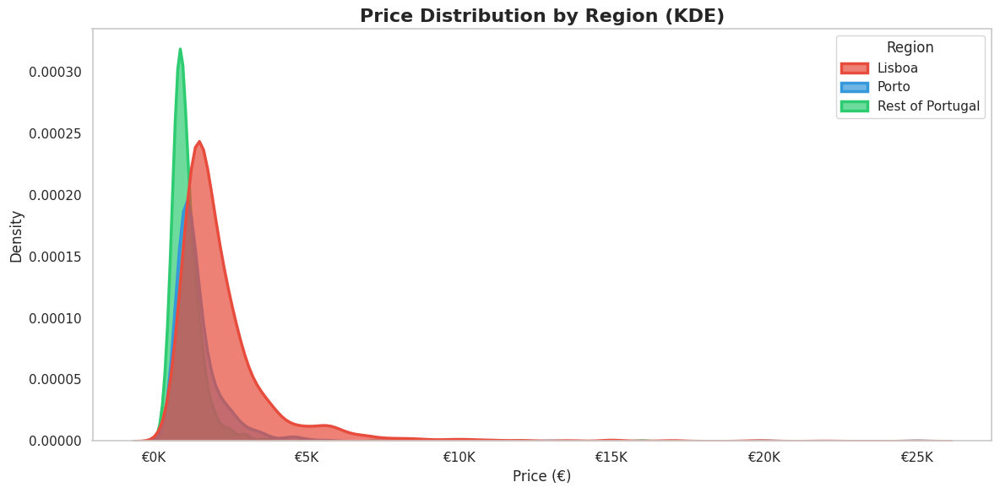


Summary by Region:
Lisboa: 3,012 properties, Median price: €1,750
Porto: 1,436 properties, Median price: €1,200
Rest of Portugal: 1,715 properties, Median price: €950


In [4]:
# --- Data Preparation: Create aggregated district column ---
def categorize_district(district):
    if pd.isna(district):
        return 'Unknown'
    district_str = str(district)
    if district_str == 'Lisboa':
        return 'Lisboa'
    elif district_str == 'Porto':
        return 'Porto'
    else:
        return 'Rest of Portugal'

# Add aggregated district column to dataframe
if 'address_district' in df.columns:
    df['district_aggregated'] = df['address_district'].apply(categorize_district)

# --- Calculate Median Prices by Typology for Lisboa, Porto, and Rest of Portugal ---
if 'district_aggregated' in df.columns and 'typology' in df.columns and 'price' in df.columns:
    # Filter for each region
    df_lisboa = df[df['district_aggregated'] == 'Lisboa'].copy()
    df_porto = df[df['district_aggregated'] == 'Porto'].copy()
    df_rest = df[df['district_aggregated'] == 'Rest of Portugal'].copy()
    
    # Calculate median price - median is often more robust to outliers than mean for prices
    median_price_lisboa_typology = df_lisboa.groupby('typology')['price'].median().round(0)
    median_price_porto_typology = df_porto.groupby('typology')['price'].median().round(0)
    median_price_rest_typology = df_rest.groupby('typology')['price'].median().round(0)
    
    # Count of listings for context
    count_lisboa_typology = df_lisboa.groupby('typology')['price'].count()
    count_porto_typology = df_porto.groupby('typology')['price'].count()
    count_rest_typology = df_rest.groupby('typology')['price'].count()
    
    # Get all unique typologies
    all_typologies = pd.Index(df['typology'].dropna().unique())
    
    # Create comprehensive comparison DataFrame
    typology_price_comparison = pd.DataFrame({
        'Lisboa Median Price (€)': median_price_lisboa_typology.reindex(all_typologies, fill_value=0),
        'Lisboa Listings Count': count_lisboa_typology.reindex(all_typologies, fill_value=0),
        'Porto Median Price (€)': median_price_porto_typology.reindex(all_typologies, fill_value=0),
        'Porto Listings Count': count_porto_typology.reindex(all_typologies, fill_value=0),
        'Rest of Portugal Median Price (€)': median_price_rest_typology.reindex(all_typologies, fill_value=0),
        'Rest of Portugal Listings Count': count_rest_typology.reindex(all_typologies, fill_value=0)
    }, index=all_typologies)
    
    # Fill NaN values with 0 and ensure integer types for display
    typology_price_comparison = typology_price_comparison.fillna(0)
    for col in typology_price_comparison.columns:
        typology_price_comparison[col] = typology_price_comparison[col].astype(int)
    
    # Sort by a typical typology order if possible (T0, T1, T2...)
    # Create a custom sort order for typologies
    typology_order = [f'T{i}' for i in range(10)] + [f'T{i}+' for i in range(10)] + ['T10+', 'Estúdio', 'Outro']
    
    # Convert index to Categorical with the defined order
    existing_typologies = [t for t in typology_order if t in typology_price_comparison.index]
    other_typologies = [t for t in typology_price_comparison.index if t not in typology_order]
    final_order = existing_typologies + sorted(other_typologies)
    
    typology_price_comparison = typology_price_comparison.reindex(final_order)
    
    # Reset index to make 'Typology' a column again for styling
    typology_price_comparison.reset_index(inplace=True)
    typology_price_comparison.rename(columns={'index': 'Typology'}, inplace=True)
    
    display(HTML("<h3>Median Housing Prices by Typology: Lisboa vs Porto vs Rest of Portugal</h3>"))
    
    # Style the DataFrame
    styled_table = typology_price_comparison.style.set_caption("Median Property Prices (€) and Listing Counts by Typology") \
                                           .format({
                                               'Lisboa Median Price (€)': "€{:,.0f}",
                                               'Porto Median Price (€)': "€{:,.0f}",
                                               'Rest of Portugal Median Price (€)': "€{:,.0f}",
                                               'Lisboa Listings Count': "{:,.0f}",
                                               'Porto Listings Count': "{:,.0f}",
                                               'Rest of Portugal Listings Count': "{:,.0f}"
                                           }) \
                                           .set_properties(**{'text-align': 'right', 'min-width': '100px'}) \
                                           .set_table_styles([
                                               {'selector': 'th', 'props': [('text-align', 'center'), ('font-weight', 'bold')]},
                                               {'selector': 'td, th', 'props': [('border', '1px solid #ddd')]},
                                               {'selector': 'caption', 'props': [('caption-side', 'top'), ('font-size', '1.1em'), ('font-weight', 'bold'), ('margin-bottom', '10px')]}
                                           ]) \
                                           .bar(subset=['Lisboa Median Price (€)', 'Porto Median Price (€)', 'Rest of Portugal Median Price (€)'], 
                                                color='#5dade2', vmin=0, align='zero') \
                                           .hide(axis="index")
    
    display(styled_table)
    
    # Create visualization
    plt.figure(figsize=(14, 8))
    
    # Prepare data for plotting
    plot_data = typology_price_comparison.set_index('Typology')[
        ['Lisboa Median Price (€)', 'Porto Median Price (€)', 'Rest of Portugal Median Price (€)']
    ]
    
    # Remove rows where all values are 0
    plot_data = plot_data[(plot_data != 0).any(axis=1)]
    
    # ax = plot_data.plot(kind='bar', figsize=(14, 8), 
    #                    color=['#e74c3c', '#3498db', '#2ecc71'],
    #                    width=0.8)
    
    # plt.title('Median Property Prices by Typology: Lisboa vs Porto vs Rest of Portugal', 
    #           fontsize=16, fontweight='bold', pad=20)
    # plt.xlabel('Typology', fontsize=12)
    # plt.ylabel('Median Price (€)', fontsize=12)
    # plt.legend(title='Region', title_fontsize=12, fontsize=10)
    # plt.xticks(rotation=45)
    # plt.grid(axis='y')
    
    # Format y-axis to show prices in thousands
    # ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'€{x/1000:.0f}K'))
    
    # plt.tight_layout()
    # plt.show()
    
    # --- KDE Plot for Price Distribution by Region ---
    plt.figure(figsize=(12, 6))
    
    # Prepare data for seaborn
    plot_data_list = []
    for region in ['Lisboa', 'Porto', 'Rest of Portugal']:
        region_prices = df[df['district_aggregated'] == region]['price'].dropna()
        for price in region_prices:
            plot_data_list.append({'Region': region, 'Price': price})
    
    plot_df = pd.DataFrame(plot_data_list)
    
    if len(plot_df) > 0:
        # Create KDE plot with seaborn
        sns.kdeplot(data=plot_df, x='Price', hue='Region', 
                   palette=['#e74c3c', '#3498db', '#2ecc71'], 
                   linewidth=2.5, alpha=0.7, fill=True)
        
        plt.title('Price Distribution by Region (KDE)', fontsize=16, fontweight='bold')
        plt.xlabel('Price (€)', fontsize=12)
        plt.ylabel('Density', fontsize=12)
        plt.grid(axis='both')
        
        # Format x-axis to show prices in thousands
        plt.gca().xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'€{x/1000:.0f}K'))
        
        plt.tight_layout()
        plt.show()
    else:
        print("No data available for KDE plot")
    
    # Summary statistics
    print(f"\nSummary by Region:")
    for region in ['Lisboa', 'Porto', 'Rest of Portugal']:
        region_data = df[df['district_aggregated'] == region]
        if len(region_data) > 0:
            median_price = region_data['price'].median()
            count = len(region_data)
            print(f"{region}: {count:,} properties, Median price: €{median_price:,.0f}")
        else:
            print(f"{region}: No data available")

else:
    display(HTML("<p style='color:orange;'>Warning: Could not generate typology price table. Required columns ('district_aggregated', 'typology', 'price') not found or df is empty.</p>"))

In [5]:
# Set a nicer global style for plots
sns.set_theme(style="whitegrid", palette="pastel")

categorical_cols = [
    'transaction_type', 'advert_type', 'advertiser_type_detail'
]

MAX_CATEGORIES_TO_PLOT = 20 # Max categories to show in a bar plot to keep it readable

for col in categorical_cols:
    if df[col].notna().sum() > 0:
        display(HTML(f"<h3>Distribution of: {col.replace('_', ' ').title()}</h3>"))

        # --- Display Value Counts as a DataFrame Table ---
        value_counts_series = df[col].value_counts(dropna=False)
        value_counts_df = pd.DataFrame({
            'Category': value_counts_series.index,
            'Count': value_counts_series.values,
            'Percentage (%)': (value_counts_series.values / len(df) * 100).round(2)
        }).reset_index(drop=True)

        # Style the DataFrame for better presentation
        styled_df = value_counts_df.style.set_caption(f"Value Counts for {col}") \
                                       .bar(subset=['Percentage (%)'], color='#5dade2', vmin=0, vmax=100) \
                                       .format({'Percentage (%)': '{:.2f}%'}) \
                                       .set_properties(**{'text-align': 'left'}) \
                                       .set_table_styles([dict(selector='th', props=[('text-align', 'left')])])
        display(styled_df)

        # --- Improved Countplot ---
        num_unique = df[col].nunique(dropna=False)
        plot_top_n = False
        if num_unique > MAX_CATEGORIES_TO_PLOT:
            plot_top_n = True
            counts_to_plot = df[col].value_counts(dropna=False).nlargest(MAX_CATEGORIES_TO_PLOT)
            order_to_plot = counts_to_plot.index
            data_to_plot = df[df[col].isin(order_to_plot)]
            title_suffix = f" (Top {MAX_CATEGORIES_TO_PLOT})"
        else:
            counts_to_plot = df[col].value_counts(dropna=False)
            order_to_plot = counts_to_plot.index
            data_to_plot = df
            title_suffix = ""

        # plt.figure(figsize=(12, max(6, len(order_to_plot) * 0.4))) # Adjust height based on num categories
        # ax = sns.countplot(y=col, data=data_to_plot, order=order_to_plot, palette="viridis") # Changed palette

        # plt.title(f'Distribution of {col.replace("_", " ").title()}{title_suffix}', fontsize=16)
        # plt.xlabel('Count', fontsize=12)
        # plt.ylabel(col.replace("_", " ").title(), fontsize=12)
        # plt.xticks(fontsize=10)
        # plt.yticks(fontsize=10)

        # # Add annotations (counts on bars)
        # for p in ax.patches:
        #     width = p.get_width()
        #     plt.text(width + (ax.get_xlim()[1] * 0.01), # Small offset from bar end
        #              p.get_y() + p.get_height() / 2.,
        #              f'{int(width)}',
        #              ha='left', va='center', fontsize=9)

        # # Ensure x-limit accommodates text
        # current_xlim = ax.get_xlim()
        # ax.set_xlim(current_xlim[0], current_xlim[1] * 1.1) # Extend x-axis limit by 10% for text

        # plt.tight_layout()
        # plt.show()
        display(HTML("<hr>")) # Add a separator
    else:
        print(f"\n--- No data to plot or display for {col} ---")

,Category,Count,Percentage (%)
0,RENT,6161,99.95%
1,INVESTMENT,2,0.03%
2,nan,1,0.02%


,Category,Count,Percentage (%)
0,AGENCY,5770,93.61%
1,PRIVATE,387,6.28%
2,DEVELOPER_UNIT,4,0.06%
3,DEVELOPER,2,0.03%
4,nan,1,0.02%


,Category,Count,Percentage (%)
0,business,5791,93.95%
1,private,372,6.04%
2,nan,1,0.02%


--- NaN/Null Value Counts per Column (Sorted) ---
                        NaN Count  NaN Percentage
bathrooms                     750           12.17
contact_phone                  85            1.38
price                          21            0.34
energy_certificate              7            0.11
typology                        6            0.10
bedrooms                        6            0.10
price_currency                  6            0.10
price_period                    6            0.10
area_m2                         4            0.06
id                              1            0.02
transaction_type                1            0.02
property_type                   1            0.02
modified_at                     1            0.02
created_at                      1            0.02
status                          1            0.02
advertiser_type_detail          1            0.02
advert_type                     1            0.02
url                             1            0.02


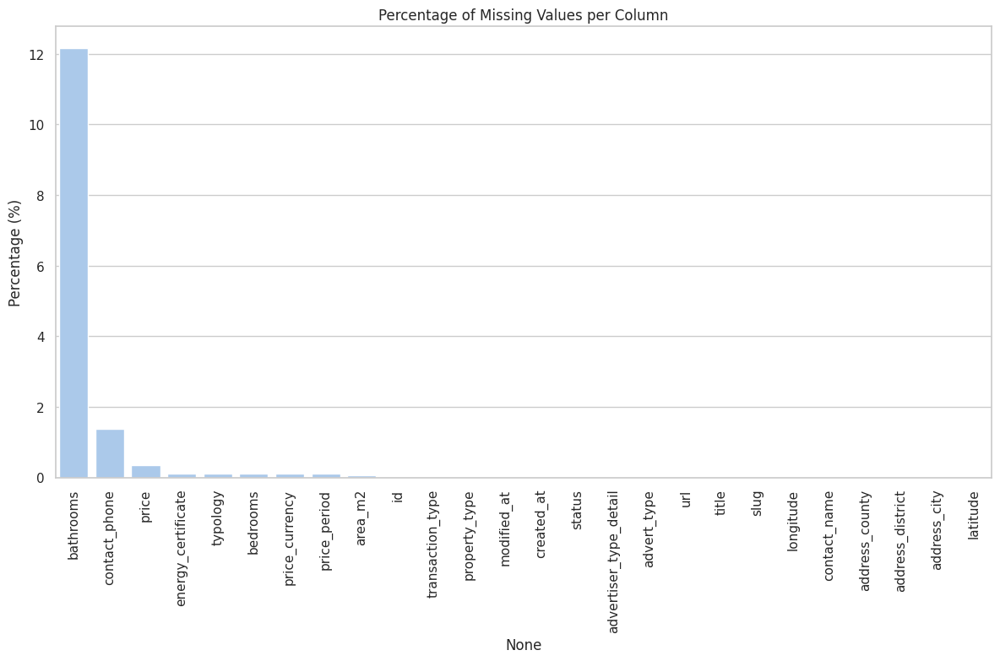

In [6]:
# Calculate NaN counts and percentages
nan_counts = df.isnull().sum()
nan_percentages = (df.isnull().sum() / len(df)) * 100
nan_summary = pd.DataFrame({'NaN Count': nan_counts, 'NaN Percentage': nan_percentages})
nan_summary = nan_summary[nan_summary['NaN Count'] > 0].sort_values(by='NaN Percentage', ascending=False)

print("--- NaN/Null Value Counts per Column (Sorted) ---")
print(nan_summary)

# Plotting NaN percentages
plt.figure(figsize=(12, 8))
sns.barplot(x=nan_summary.index, y=nan_summary['NaN Percentage'])
plt.xticks(rotation=90)
plt.title('Percentage of Missing Values per Column')
plt.ylabel('Percentage (%)')
plt.tight_layout()
plt.show()

# Notes on missing values:
# - 'bathrooms' has ~12% missing. Could impute with median/mode based on 'typology' or 'area_m2', or use a placeholder.
# - 'contact_phone' has ~1.7% missing. Might not be critical for analysis unless focusing on contact info.
# - 'price', 'price_currency', 'price_period', 'area_m2', 'typology', 'bedrooms', 'energy_certificate' have a small number of missings.
#   Rows with missing 'price' might need to be dropped for price prediction tasks.
# - Many columns have exactly 12 missings (after potential duplicate 'id' processing). This suggests some records might be incomplete.
#   These 12 rows (if they are the same rows) could be inspected or dropped if critical info is missing.
#   If `id` was NaN for these, and then other fields were NaN, it makes sense.

,price,area_m2,bedrooms,bathrooms,latitude,longitude
count,"6,143.00","6,160.00","6,158.00","5,414.00","6,163.00","6,163.00"
mean,"1,760.44",130.75,2.11,1.63,39.61,-8.89
std,"1,547.50","1,894.32",1.10,0.69,1.22,0.41
min,240.00,1.00,0.00,1.00,37.01,-9.46
1%,497.10,25.00,0.00,1.00,37.10,-9.43
5%,700.00,37.80,0.00,1.00,38.60,-9.40
25%,990.00,60.00,1.00,1.00,38.71,-9.17
50%,"1,350.00",88.00,2.00,2.00,38.77,-9.10
75%,"2,000.00",119.00,3.00,2.00,41.14,-8.62
95%,"4,000.00",182.00,4.00,3.00,41.44,-8.29


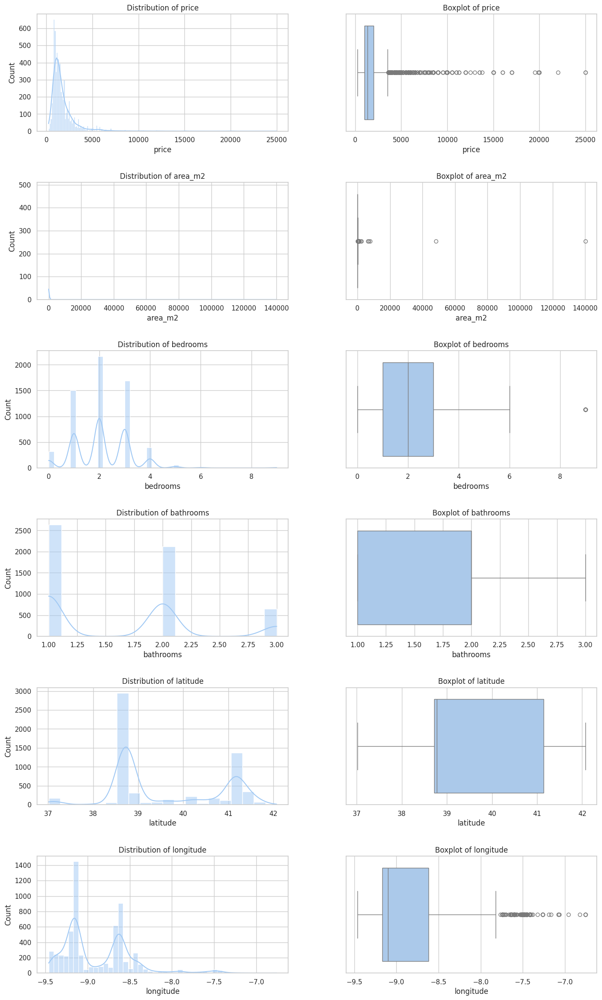

In [7]:


numerical_cols = ['price', 'area_m2', 'bedrooms', 'bathrooms', 'latitude', 'longitude']
# bedrooms and bathrooms are Int64, but can be treated as numerical for distributions

display(HTML("<h3>Descriptive Statistics (Numerical Columns)</h3>")) # Changed
descriptive_stats_df = df[numerical_cols].describe(percentiles=[.01, .05, .25, .5, .75, .95, .99]) # Changed
display(descriptive_stats_df.style.format("{:,.2f}").set_caption("Summary Statistics")) # Changed

fig, axes = plt.subplots(nrows=len(numerical_cols), ncols=2, figsize=(15, len(numerical_cols) * 4))
fig.tight_layout(pad=5.0)

for i, col in enumerate(numerical_cols):
    if df[col].notna().sum() > 0: # Check if there's any non-NaN data to plot
        sns.histplot(df[col].dropna(), kde=True, ax=axes[i, 0])
        axes[i, 0].set_title(f'Distribution of {col}')

        sns.boxplot(x=df[col].dropna(), ax=axes[i, 1])
        axes[i, 1].set_title(f'Boxplot of {col}')
    else:
        axes[i, 0].set_title(f'Distribution of {col} (No Data)')
        axes[i, 1].set_title(f'Boxplot of {col} (No Data)')

plt.show()

# Observations:
# - 'price' and 'area_m2' likely skewed, may need transformation (log) for modeling.
# - Check for unrealistic values (e.g., area_m2 = 0 or very high, price = 0).

,Category,Count,Percentage (%)
0,AGENCY,5770,93.61%
1,PRIVATE,387,6.28%
2,DEVELOPER_UNIT,4,0.06%
3,DEVELOPER,2,0.03%
4,nan,1,0.02%


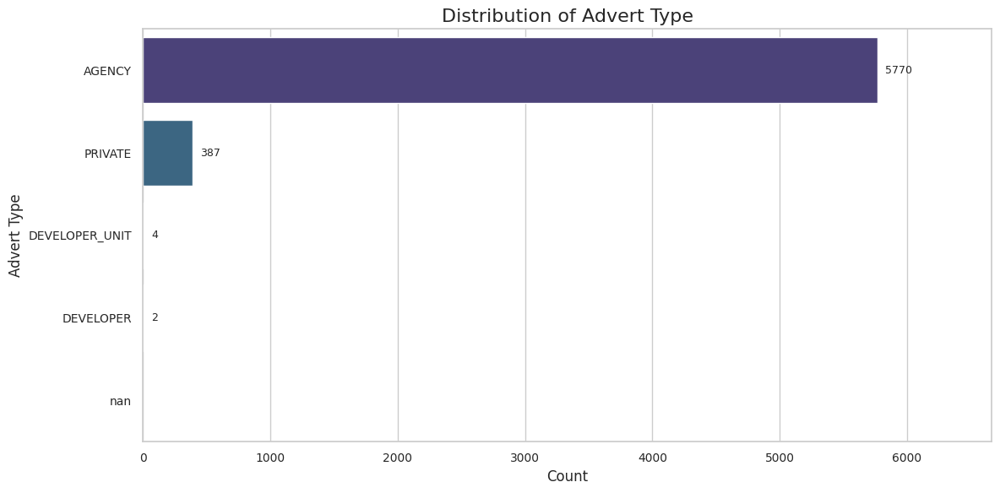

,Category,Count,Percentage (%)
0,business,5791,93.95%
1,private,372,6.04%
2,nan,1,0.02%


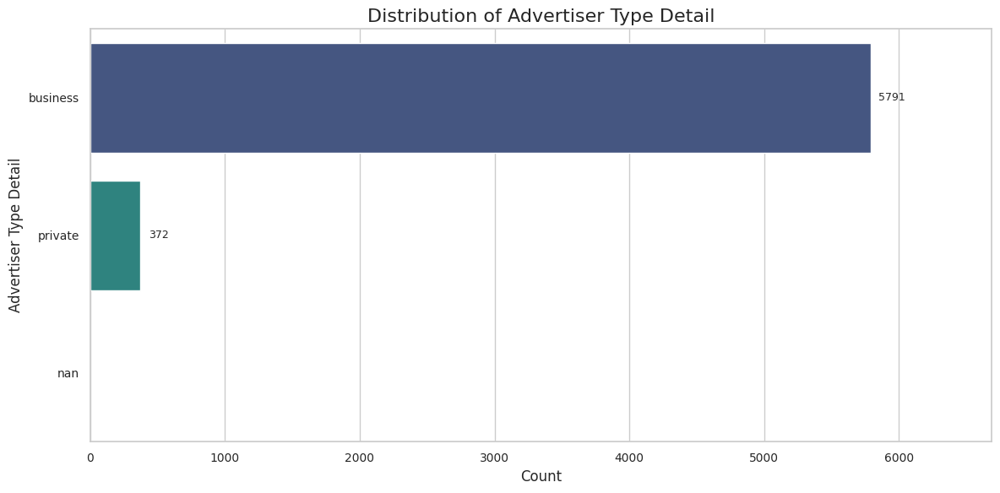

,Category,Count,Percentage (%)
0,active,6163,99.98%
1,nan,1,0.02%


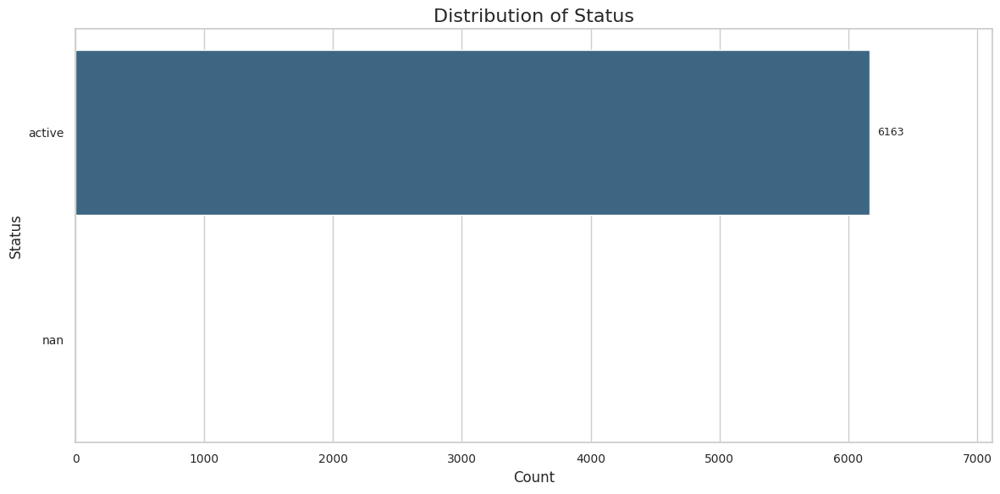

,Category,Count,Percentage (%)
0,FLAT,6163,99.98%
1,nan,1,0.02%


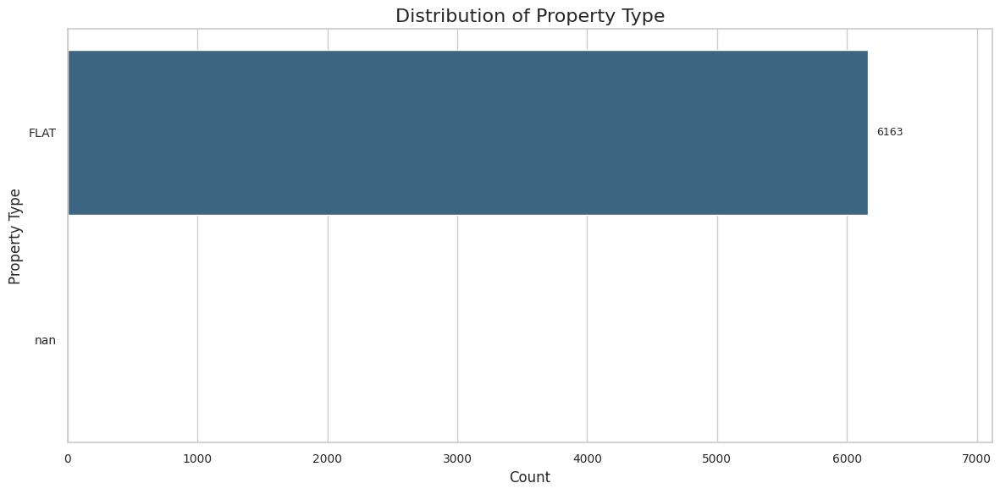

,Category,Count,Percentage (%)
0,RENT,6161,99.95%
1,INVESTMENT,2,0.03%
2,nan,1,0.02%


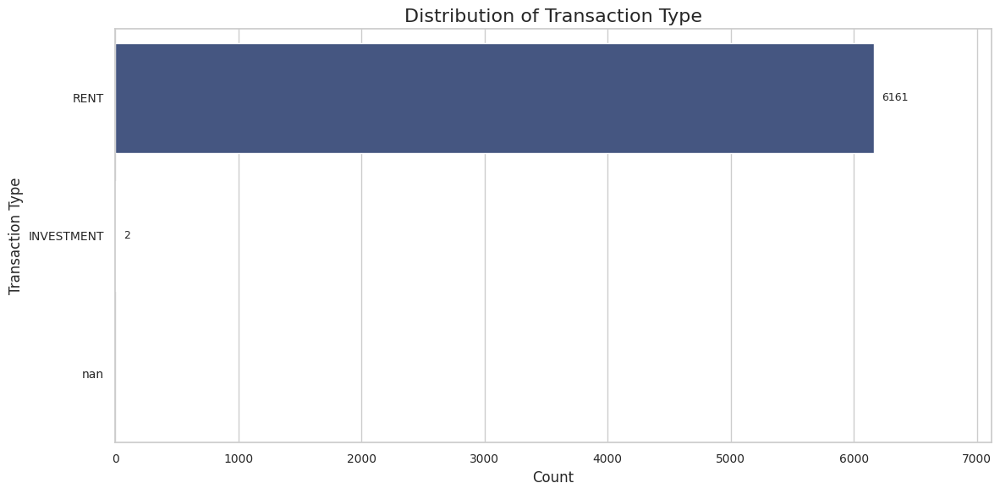

,Category,Count,Percentage (%)
0,mês,6158,99.90%
1,nan,6,0.10%


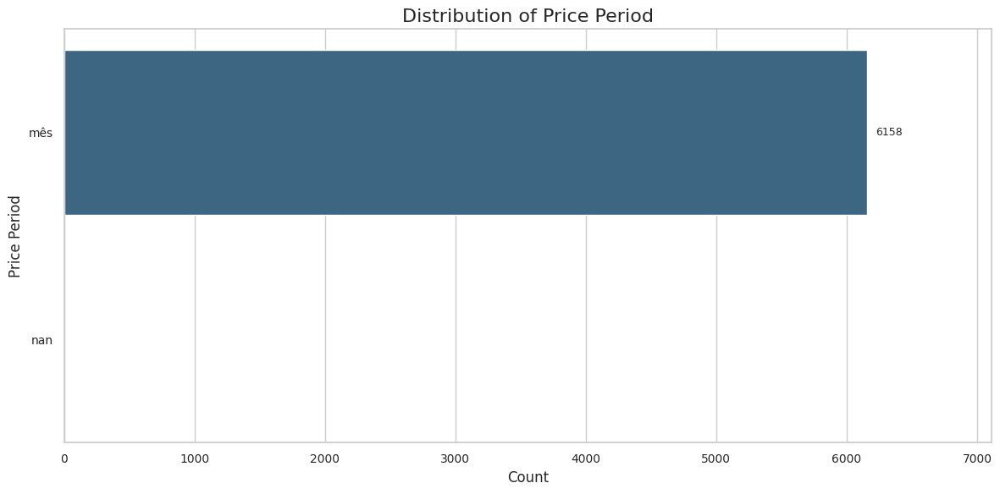

,Category,Count,Percentage (%)
0,T2,2162,35.07%
1,T3,1687,27.37%
2,T1,1502,24.37%
3,T4,395,6.41%
4,T0,324,5.26%
5,T5,57,0.92%
6,T6,17,0.28%
7,T9+,13,0.21%
8,nan,6,0.10%
9,T9,1,0.02%


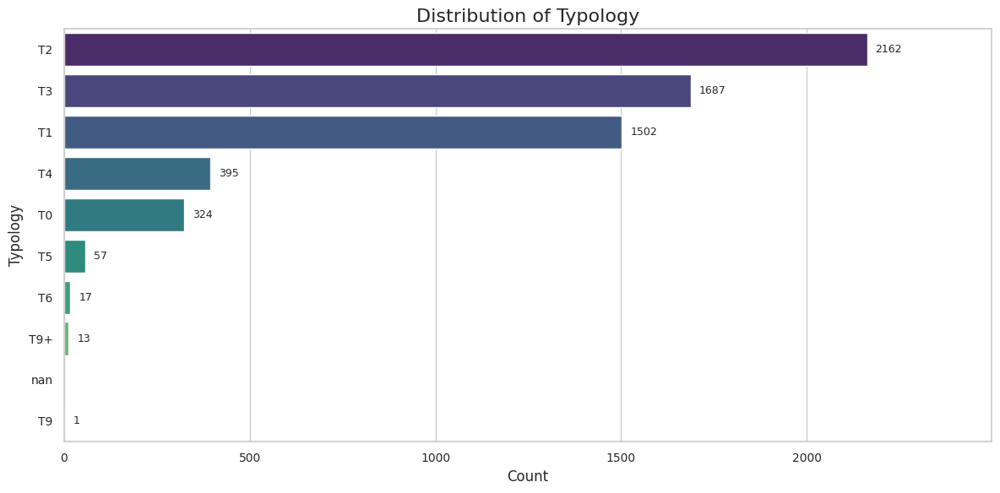

,Category,Count,Percentage (%)
0,C,1852,30.05%
1,D,1120,18.17%
2,A,793,12.87%
3,B,570,9.25%
4,B-,495,8.03%
5,isento / em curso,471,7.64%
6,E,456,7.40%
7,A+,238,3.86%
8,F,147,2.38%
9,G,15,0.24%


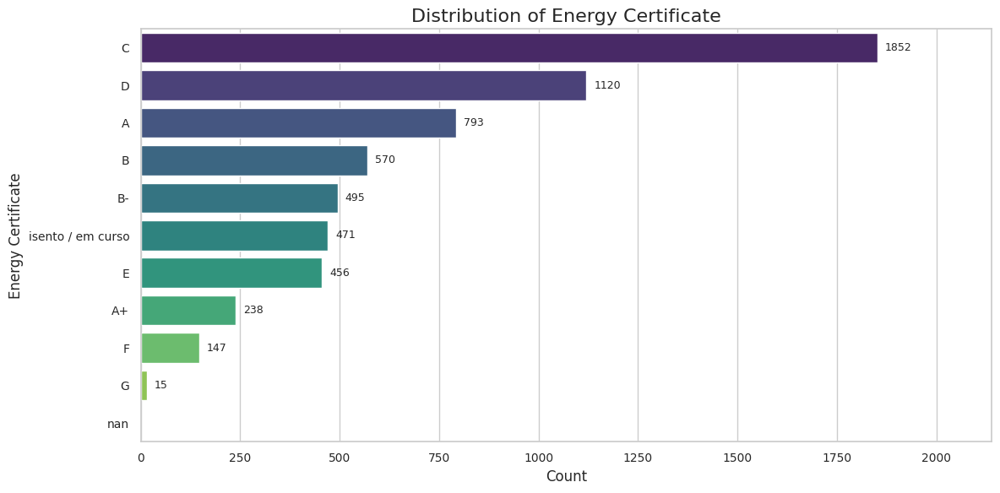

,Category,Count,Percentage (%)
0,Lisboa,1732,28.10%
1,Porto,794,12.88%
2,Cascais,511,8.29%
3,Vila Nova de Gaia,250,4.06%
4,Oeiras,209,3.39%
5,Matosinhos,191,3.10%
6,Braga,181,2.94%
7,Coimbra,153,2.48%
8,Sintra,150,2.43%
9,Aveiro,106,1.72%


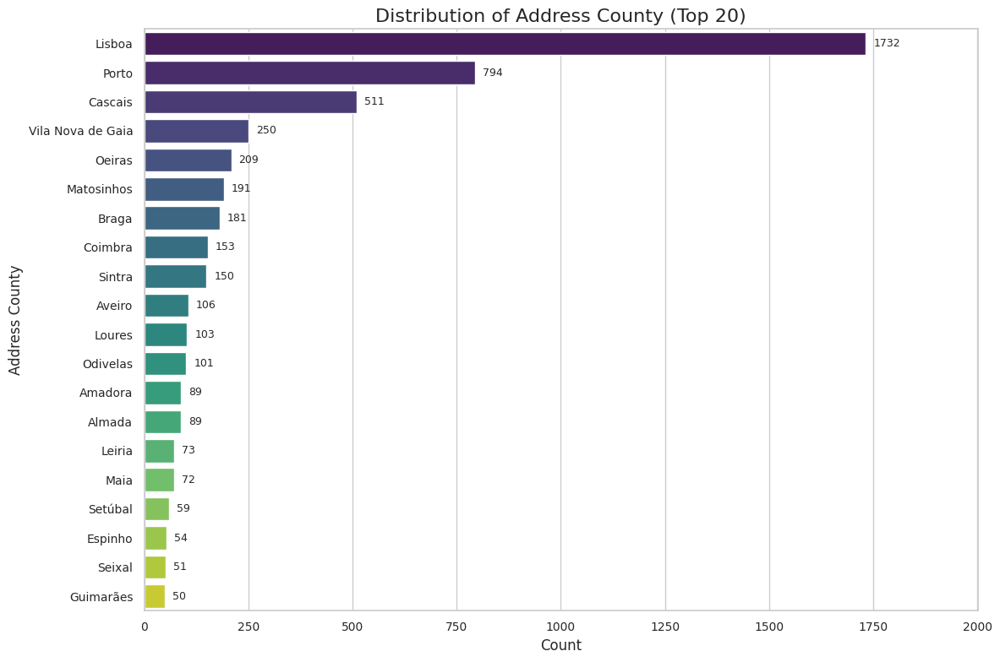

,Category,Count,Percentage (%)
0,Lisboa,3012,48.86%
1,Porto,1436,23.30%
2,Setúbal,350,5.68%
3,Braga,301,4.88%
4,Aveiro,251,4.07%
5,Coimbra,205,3.33%
6,Faro,180,2.92%
7,Leiria,174,2.82%
8,Santarém,86,1.40%
9,Viana do Castelo,39,0.63%


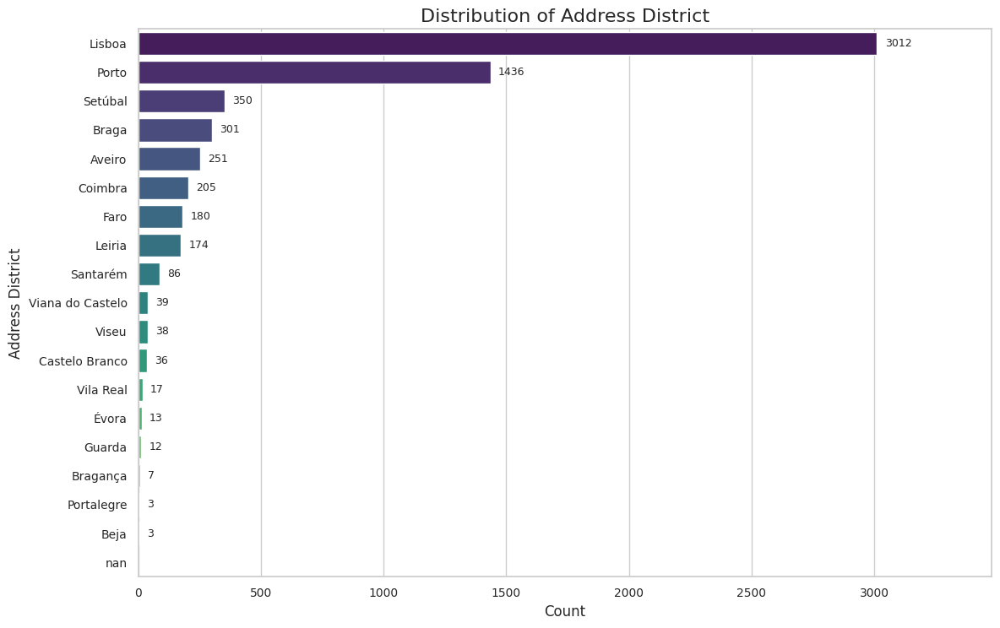

,Category,Count,Percentage (%)
0,Cascais e Estoril,338,5.48%
1,"Cedofeita, Santo Ildefonso, Sé, Miragaia, São Nicolau e Vitória",236,3.83%
2,Avenidas Novas,163,2.64%
3,Paranhos,157,2.55%
4,Santo António,134,2.17%
5,Santa Maria Maior,133,2.16%
6,Matosinhos e Leça da Palmeira,125,2.03%
7,Estrela,122,1.98%
8,Carcavelos e Parede,116,1.88%
9,"Oeiras e São Julião da Barra, Paço de Arcos e Caxias",107,1.74%


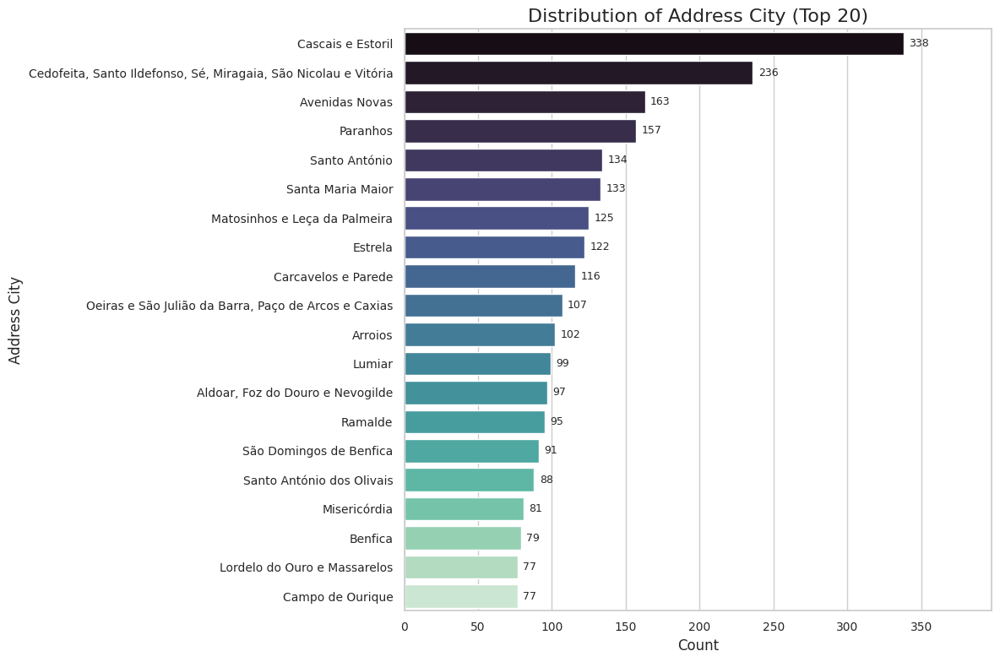

In [8]:
# Set a nicer global style for plots
sns.set_theme(style="whitegrid", palette="pastel")

categorical_cols = [
    'advert_type', 'advertiser_type_detail', 'status', 'property_type',
    'transaction_type', 'price_period', 'typology',
    'energy_certificate', 'address_county', 'address_district'
]

MAX_CATEGORIES_TO_PLOT = 20 # Max categories to show in a bar plot to keep it readable

for col in categorical_cols:
    if df[col].notna().sum() > 0:
        display(HTML(f"<h3>Distribution of: {col.replace('_', ' ').title()}</h3>"))

        # --- Display Value Counts as a DataFrame Table ---
        value_counts_series = df[col].value_counts(dropna=False)
        value_counts_df = pd.DataFrame({
            'Category': value_counts_series.index,
            'Count': value_counts_series.values,
            'Percentage (%)': (value_counts_series.values / len(df) * 100).round(2)
        }).reset_index(drop=True)

        # Style the DataFrame for better presentation
        styled_df = value_counts_df.style.set_caption(f"Value Counts for {col}") \
                                       .bar(subset=['Percentage (%)'], color='#5dade2', vmin=0, vmax=100) \
                                       .format({'Percentage (%)': '{:.2f}%'}) \
                                       .set_properties(**{'text-align': 'left'}) \
                                       .set_table_styles([dict(selector='th', props=[('text-align', 'left')])])
        display(styled_df)

        # --- Improved Countplot ---
        num_unique = df[col].nunique(dropna=False)
        plot_top_n = False
        if num_unique > MAX_CATEGORIES_TO_PLOT:
            plot_top_n = True
            counts_to_plot = df[col].value_counts(dropna=False).nlargest(MAX_CATEGORIES_TO_PLOT)
            order_to_plot = counts_to_plot.index
            data_to_plot = df[df[col].isin(order_to_plot)]
            title_suffix = f" (Top {MAX_CATEGORIES_TO_PLOT})"
        else:
            counts_to_plot = df[col].value_counts(dropna=False)
            order_to_plot = counts_to_plot.index
            data_to_plot = df
            title_suffix = ""

        plt.figure(figsize=(12, max(6, len(order_to_plot) * 0.4))) # Adjust height based on num categories
        ax = sns.countplot(y=col, data=data_to_plot, order=order_to_plot, palette="viridis") # Changed palette

        plt.title(f'Distribution of {col.replace("_", " ").title()}{title_suffix}', fontsize=16)
        plt.xlabel('Count', fontsize=12)
        plt.ylabel(col.replace("_", " ").title(), fontsize=12)
        plt.xticks(fontsize=10)
        plt.yticks(fontsize=10)

        # Add annotations (counts on bars)
        for p in ax.patches:
            width = p.get_width()
            plt.text(width + (ax.get_xlim()[1] * 0.01), # Small offset from bar end
                     p.get_y() + p.get_height() / 2.,
                     f'{int(width)}',
                     ha='left', va='center', fontsize=9)

        # Ensure x-limit accommodates text
        current_xlim = ax.get_xlim()
        ax.set_xlim(current_xlim[0], current_xlim[1] * 1.1) # Extend x-axis limit by 10% for text

        plt.tight_layout()
        plt.show()
        display(HTML("<hr>")) # Add a separator
    else:
        print(f"\n--- No data to plot or display for {col} ---")

# --- Special handling for 'address_city' (high cardinality) ---
display(HTML(f"<h3>Distribution of: Address City (Top {MAX_CATEGORIES_TO_PLOT})</h3>"))
if 'address_city' in df.columns:
    city_value_counts_series = df['address_city'].value_counts(dropna=False).nlargest(MAX_CATEGORIES_TO_PLOT)
    city_value_counts_df = pd.DataFrame({
        'Category': city_value_counts_series.index,
        'Count': city_value_counts_series.values,
        'Percentage (%)': (city_value_counts_series.values / len(df) * 100).round(2)
    }).reset_index(drop=True)

    styled_city_df = city_value_counts_df.style.set_caption(f"Top {MAX_CATEGORIES_TO_PLOT} Value Counts for Address City") \
                                           .bar(subset=['Percentage (%)'], color='#5dade2', vmin=0, vmax=100) \
                                           .format({'Percentage (%)': '{:.2f}%'}) \
                                           .set_properties(**{'text-align': 'left'}) \
                                           .set_table_styles([dict(selector='th', props=[('text-align', 'left')])])
    display(styled_city_df)

    # Optional: Plot for top N cities as well
    plt.figure(figsize=(12, max(6, MAX_CATEGORIES_TO_PLOT * 0.4)))
    ax_city = sns.countplot(y='address_city', data=df[df['address_city'].isin(city_value_counts_series.index)],
                            order=city_value_counts_series.index, palette="mako")
    plt.title(f'Distribution of Address City (Top {MAX_CATEGORIES_TO_PLOT})', fontsize=16)
    plt.xlabel('Count', fontsize=12)
    plt.ylabel('Address City', fontsize=12)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    for p in ax_city.patches:
        width = p.get_width()
        plt.text(width + (ax_city.get_xlim()[1] * 0.01),
                 p.get_y() + p.get_height() / 2.,
                 f'{int(width)}',
                 ha='left', va='center', fontsize=9)
    current_xlim_city = ax_city.get_xlim()
    ax_city.set_xlim(current_xlim_city[0], current_xlim_city[1] * 1.12) # Extend x-axis limit
    plt.tight_layout()
    plt.show()
else:
    print("Column 'address_city' not found.")

,Original Value,Parsed List (Sample),Num Items
2766,"['frigorífico', 'mobiliário', 'forno', 'fogão', 'condomínio fechado', 'Acessibilidade para pessoas com mobilidade reduzida', 'ar condicionado', 'varanda', 'elevador', 'piscina']","['frigorífico', 'mobiliário', 'forno', 'fogão', 'condomínio fechado', ...",10
2767,"['frigorífico', 'forno', 'fogão', 'mobiliário', 'sistema de alarme', 'condomínio fechado', 'monitorização', 'Acessibilidade para pessoas com mobilidade reduzida', 'ar condicionado', 'elevador', 'piscina', 'varanda']","['frigorífico', 'forno', 'fogão', 'mobiliário', 'sistema de alarme', '...",12
2778,"['frigorífico', 'forno', 'fogão', 'mobiliário', 'condomínio fechado', 'ar condicionado', 'piscina', 'varanda']","['frigorífico', 'forno', 'fogão', 'mobiliário', 'condomínio fechado', ...",8
182,"['frigorífico', 'mobiliário', 'forno', 'fogão', 'garagem']","['frigorífico', 'mobiliário', 'forno', 'fogão', 'garagem']",5
4103,"['máquina de lavar louça', 'frigorífico', 'mobiliário', 'forno', 'fogão', 'TV', 'máquina de lavar roupa', 'portas e janelas de segurança', 'intercomunicador / videoporteiro', 'televisão por cabo', 'internet', 'jardim', 'elevador', 'apenas não fumadores']","['máquina de lavar louça', 'frigorífico', 'mobiliário', 'forno', 'fogã...",14


,Value
count,6164.000000
mean,2.710000
std,3.810000
min,0.000000
25%,0.000000
50%,1.000000
75%,4.000000
max,25.000000


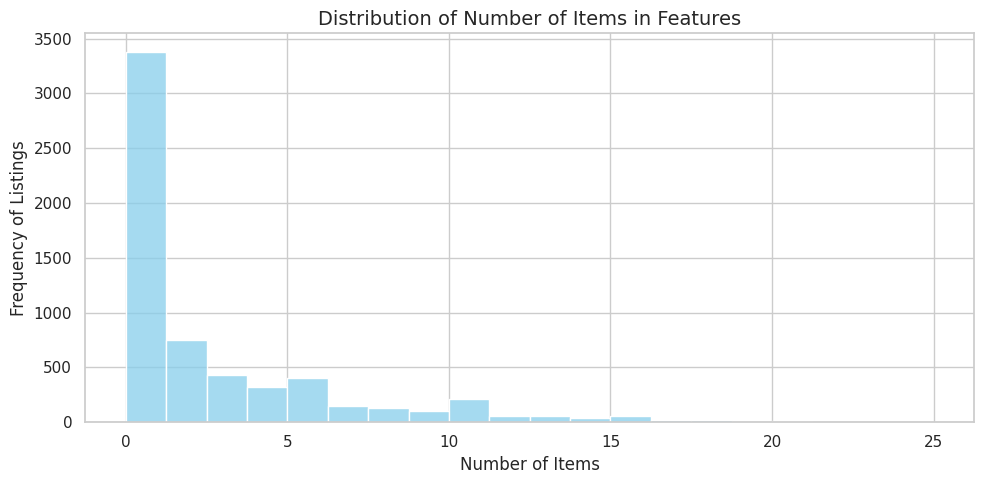

,Item,Frequency,Percentage (%)
0,elevador,2614,15.65%
1,varanda,1563,9.36%
2,garagem,1554,9.31%
3,ar condicionado,1192,7.14%
4,forno,1029,6.16%
5,frigorífico,919,5.50%
6,fogão,882,5.28%
7,máquina de lavar roupa,769,4.61%
8,máquina de lavar louça,646,3.87%
9,intercomunicador / videoporteiro,599,3.59%


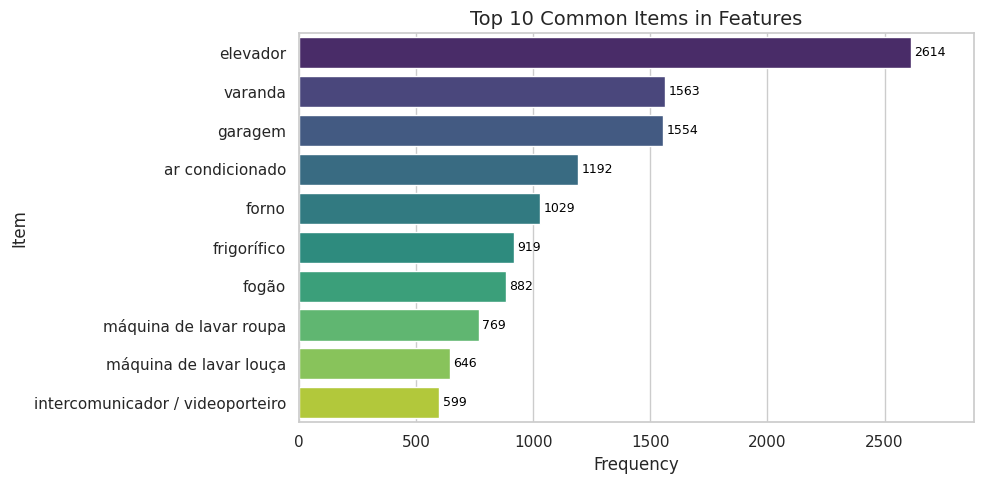

,Original Value,Parsed List (Sample),Num Items
2766,"['{""__typename"": ""FeatureGroup"", ""label"": ""Equipamento"", ""values"": [""frigorífico"", ""mobiliário"", ""forno"", ""fogão""]}', '{""__typename"": ""FeatureGroup"", ""label"": ""Segurança"", ""values"": [""condomínio fechado""]}', '{""__typename"": ""FeatureGroup"", ""label"": ""Informações adicionais"", ""values"": [""Acessibilidade para pessoas com mobilidade reduzida"", ""ar condicionado"", ""varanda"", ""elevador"", ""piscina""]}']","['{""__typename"": ""FeatureGroup"", ""label"": ""Equipamento"", ""values"": [""f...",3
2767,"['{""__typename"": ""FeatureGroup"", ""label"": ""Equipamento"", ""values"": [""frigorífico"", ""forno"", ""fogão"", ""mobiliário""]}', '{""__typename"": ""FeatureGroup"", ""label"": ""Segurança"", ""values"": [""sistema de alarme"", ""condomínio fechado"", ""monitorização""]}', '{""__typename"": ""FeatureGroup"", ""label"": ""Informações adicionais"", ""values"": [""Acessibilidade para pessoas com mobilidade reduzida"", ""ar condicionado"", ""elevador"", ""piscina"", ""varanda""]}']","['{""__typename"": ""FeatureGroup"", ""label"": ""Equipamento"", ""values"": [""f...",3
2778,"['{""__typename"": ""FeatureGroup"", ""label"": ""Equipamento"", ""values"": [""frigorífico"", ""forno"", ""fogão"", ""mobiliário""]}', '{""__typename"": ""FeatureGroup"", ""label"": ""Segurança"", ""values"": [""condomínio fechado""]}', '{""__typename"": ""FeatureGroup"", ""label"": ""Informações adicionais"", ""values"": [""ar condicionado"", ""piscina"", ""varanda""]}']","['{""__typename"": ""FeatureGroup"", ""label"": ""Equipamento"", ""values"": [""f...",3
182,"['{""__typename"": ""FeatureGroup"", ""label"": ""Equipamento"", ""values"": [""frigorífico"", ""mobiliário"", ""forno"", ""fogão""]}', '{""__typename"": ""FeatureGroup"", ""label"": ""Informações adicionais"", ""values"": [""garagem""]}']","['{""__typename"": ""FeatureGroup"", ""label"": ""Equipamento"", ""values"": [""f...",2
4103,"['{""__typename"": ""FeatureGroup"", ""label"": ""Equipamento"", ""values"": [""máquina de lavar louça"", ""frigorífico"", ""mobiliário"", ""forno"", ""fogão"", ""TV"", ""máquina de lavar roupa""]}', '{""__typename"": ""FeatureGroup"", ""label"": ""Segurança"", ""values"": [""portas e janelas de segurança"", ""intercomunicador / videoporteiro""]}', '{""__typename"": ""FeatureGroup"", ""label"": ""Utilidades"", ""values"": [""televisão por cabo"", ""internet""]}', '{""__typename"": ""FeatureGroup"", ""label"": ""Informações adicionais"", ""values"": [""jardim"", ""elevador"", ""apenas não fumadores""]}']","['{""__typename"": ""FeatureGroup"", ""label"": ""Equipamento"", ""values"": [""m...",4


,Value
count,6164.000000
mean,0.980000
std,1.030000
min,0.000000
25%,0.000000
50%,1.000000
75%,1.000000
max,4.000000


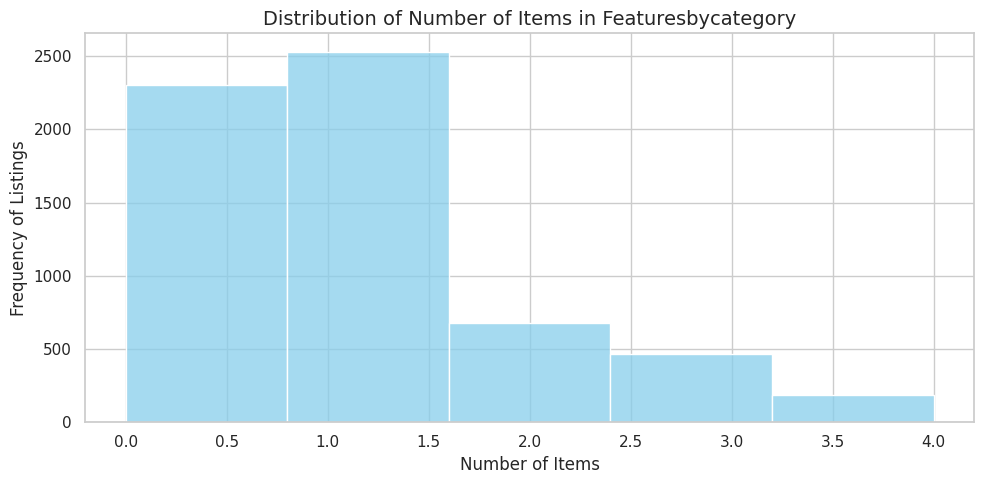

,Item,Frequency,Percentage (%)
0,"{""__typename"": ""FeatureGroup"", ""label"": ""Informações adicionais"", ""values"": [""elevador""]}",668,11.07%
1,"{""__typename"": ""FeatureGroup"", ""label"": ""Segurança"", ""values"": [""intercomunicador / videoporteiro""]}",244,4.04%
2,"{""__typename"": ""FeatureGroup"", ""label"": ""Informações adicionais"", ""values"": [""garagem"", ""elevador""]}",216,3.58%
3,"{""__typename"": ""FeatureGroup"", ""label"": ""Informações adicionais"", ""values"": [""garagem""]}",185,3.07%
4,"{""__typename"": ""FeatureGroup"", ""label"": ""Informações adicionais"", ""values"": [""varanda""]}",162,2.69%
5,"{""__typename"": ""FeatureGroup"", ""label"": ""Informações adicionais"", ""values"": [""ar condicionado""]}",154,2.55%
6,"{""__typename"": ""FeatureGroup"", ""label"": ""Segurança"", ""values"": [""portas e janelas de segurança"", ""intercomunicador / videoporteiro""]}",152,2.52%
7,"{""__typename"": ""FeatureGroup"", ""label"": ""Segurança"", ""values"": [""portas e janelas de segurança""]}",111,1.84%
8,"{""__typename"": ""FeatureGroup"", ""label"": ""Informações adicionais"", ""values"": [""varanda"", ""elevador""]}",105,1.74%
9,"{""__typename"": ""FeatureGroup"", ""label"": ""Utilidades"", ""values"": [""internet""]}",98,1.62%


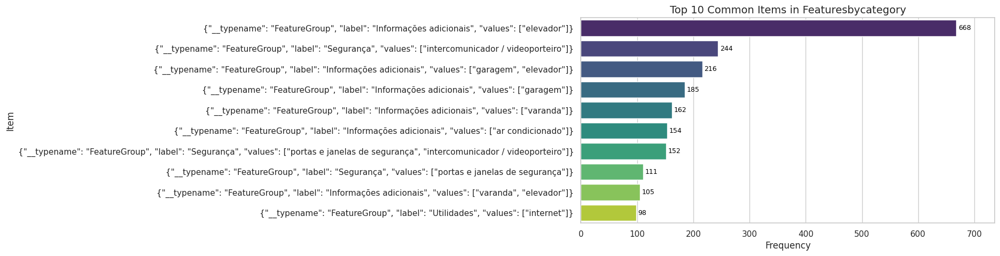

,Original Value,Parsed List (Sample),Num Items
2766,[],[],0
2767,[],[],0
2778,[],[],0
182,[],[],0
4103,[],[],0


,Value
count,6164.000000
mean,0.010000
std,0.110000
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,1.000000


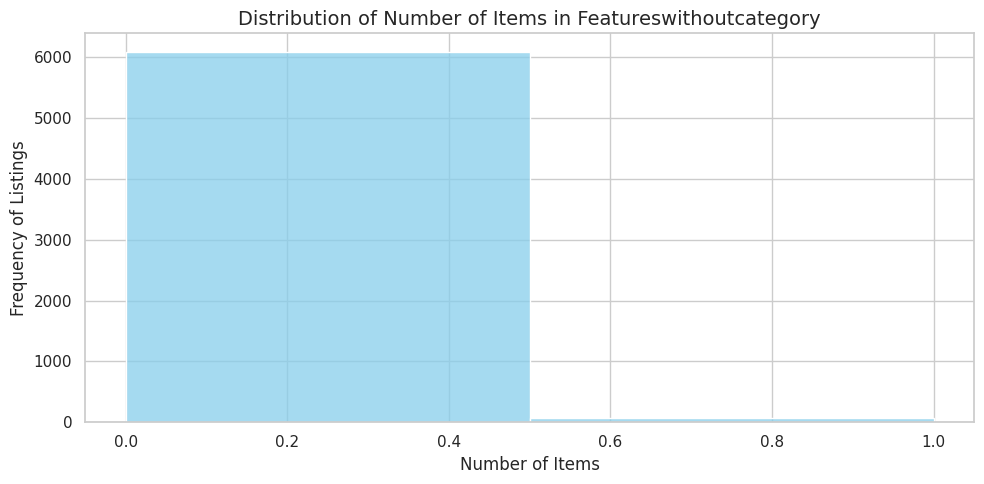

,Item,Frequency,Percentage (%)
0,Disponível para estudantes,76,100.00%


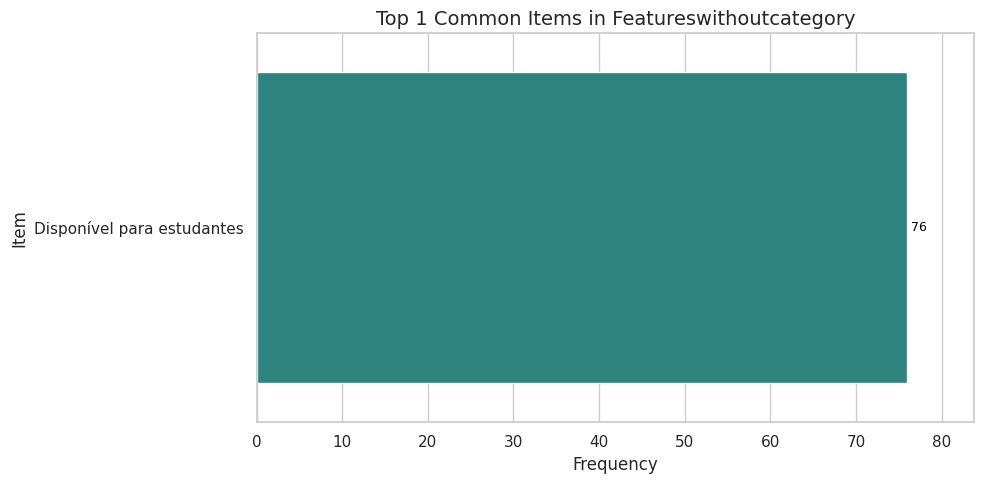

In [9]:
# Set a nicer global style for plots
sns.set_theme(style="whitegrid", palette="pastel")

MAX_COMMON_ITEMS_TO_DISPLAY = 10 # For the table of exploded features

for col_name in ['features', 'featuresByCategory', 'featuresWithoutCategory']:
    col_title = col_name.replace('_', ' ').title()
    display(HTML(f"<h2>Analysis of List Column: {col_title}</h2>"))

    # --- 1. Parse the List-like Column ---
    def parse_feature_list_revised(val): # Keep your robust parser
        if isinstance(val, list): return val
        if isinstance(val, str):
            try:
                parsed_val = ast.literal_eval(val)
                return parsed_val if isinstance(parsed_val, list) else []
            except (ValueError, SyntaxError): return []
        if val is None or (pd.api.types.is_scalar(val) and pd.isna(val)): return []
        if isinstance(val, np.ndarray): return val.tolist()
        return []

    df[f'{col_name}_list'] = df[col_name].apply(parse_feature_list_revised)
    df[f'num_{col_name}'] = df[f'{col_name}_list'].apply(len)
    assert df[f'{col_name}_list'].apply(lambda x: isinstance(x, list)).all(), f"Column {col_name}_list not all lists!"

    # --- 2. Display Sample Data and Parsed Lists (Styled HTML Table) ---
    display(HTML("<h4>Sample Data & Parsed Lists (First 5 Rows):</h4>"))
    sample_df_display = df[[col_name, f'{col_name}_list', f'num_{col_name}']].head().copy()
    # Truncate long list representations for display
    sample_df_display[f'{col_name}_list'] = sample_df_display[f'{col_name}_list'].apply(lambda x: str(x)[:70] + '...' if len(str(x)) > 70 else str(x))
    sample_df_display.columns = ['Original Value', 'Parsed List (Sample)', 'Num Items']
    display(sample_df_display.style.set_caption("Sample Data").set_properties(**{'text-align': 'left', 'max-width': '300px'}))


    # --- 3. Display Descriptive Stats for Number of Items (Styled HTML Table) ---
    display(HTML("<h4>Descriptive Statistics for Number of Items per Listing:</h4>"))
    desc_stats_num_items = df[f'num_{col_name}'].describe().to_frame().round(2)
    desc_stats_num_items.columns = ['Value']
    display(desc_stats_num_items.style.set_caption(f"Stats for num_{col_name}"))


    # --- 4. Plot Histogram for Number of Items ---
    if df[f'num_{col_name}'].notna().any() and df[f'num_{col_name}'].nunique() > 0:
        plt.figure(figsize=(10, 5)) # Adjusted size for single plot
        sns.histplot(df[f'num_{col_name}'],
                     bins=max(1, min(20, df[f'num_{col_name}'].nunique())),
                     kde=False, color="skyblue")
        plt.title(f'Distribution of Number of Items in {col_title}', fontsize=14)
        plt.xlabel('Number of Items', fontsize=12)
        plt.ylabel('Frequency of Listings', fontsize=12)
        plt.tight_layout()
        plt.show()
    else:
        display(HTML("<p><em>No data or no variance in the number of items to plot.</em></p>"))


    # --- 5. Analyze and Display Top Common Exploded Items (Styled HTML Table & Optional Bar Plot) ---
    first_item_type = None
    can_explode_simple_features = False
    top_common_items_series = None

    if df[f'num_{col_name}'].sum() > 0: # Only check if there are any items at all
        for item_list in df[f'{col_name}_list']:
            if item_list: # If list is not empty
                actual_item = next((item for item in item_list if not (isinstance(item, float) and np.isnan(item))), None) # Get first non-NaN item
                if actual_item is not None:
                    if isinstance(actual_item, (str, int, float, bool)):
                        first_item_type = type(actual_item)
                        can_explode_simple_features = True
                    else:
                        first_item_type = 'complex'
                        display(HTML(f"<p><em>Note: Items in '{col_title}' lists are complex (e.g., dicts like: {str(actual_item)[:100]}...). Skipping common item analysis.</em></p>"))
                    break # Found type, no need to check further lists

    if can_explode_simple_features:
        display(HTML(f"<h4>Top {MAX_COMMON_ITEMS_TO_DISPLAY} Most Common Individual Items in '{col_title}':</h4>"))
        try:
            series_to_explode = df[df[f'num_{col_name}'] > 0][f'{col_name}_list']
            if not series_to_explode.empty:
                exploded_features = series_to_explode.explode().dropna() # Explode and drop NaNs from exploded series
                if not exploded_features.empty:
                    top_common_items_series = exploded_features.value_counts(dropna=True).nlargest(MAX_COMMON_ITEMS_TO_DISPLAY)

                    if not top_common_items_series.empty:
                        top_common_items_df = top_common_items_series.reset_index()
                        top_common_items_df.columns = ['Item', 'Frequency']
                        top_common_items_df['Percentage (%)'] = (top_common_items_df['Frequency'] / len(exploded_features) * 100).round(2)
                        display(top_common_items_df.style.set_caption(f"Top Common Items in {col_title}")
                                                        .bar(subset=['Percentage (%)'], color='#5dade2', vmin=0)
                                                        .format({'Percentage (%)': '{:.2f}%'}))

                        # Optional: Bar plot for these top common items
                        plt.figure(figsize=(10, max(5, len(top_common_items_series) * 0.4)))
                        sns.barplot(x='Frequency', y='Item', data=top_common_items_df, palette="viridis", dodge=False) # dodge=False if only one series
                        plt.title(f'Top {len(top_common_items_series)} Common Items in {col_title}', fontsize=14)
                        plt.xlabel('Frequency', fontsize=12)
                        plt.ylabel('Item', fontsize=12)
                        # Add counts to bars
                        for index, row in top_common_items_df.iterrows():
                            plt.text(row.Frequency + (plt.xlim()[1]*0.005), index, str(int(row.Frequency)), color='black', va='center', fontsize=9)
                        current_xlim = plt.xlim()
                        plt.xlim(current_xlim[0], current_xlim[1]*1.05)
                        plt.tight_layout()
                        plt.show()
                    else:
                        display(HTML("<p><em>No common items found after exploding and dropping NaNs.</em></p>"))
                else:
                    display(HTML("<p><em>No non-NaN items to analyze after exploding the lists.</em></p>"))
            else:
                display(HTML(f"<p><em>No lists with items to explode in '{col_title}'.</em></p>"))
        except Exception as e:
            display(HTML(f"<p><em>Could not explode or process items for '{col_title}'. Error: {e}.</em></p>"))

    display(HTML("<hr>")) # Separator after each column's analysis

In [10]:
# # This column is {'locations': []}, so it's a dict containing a list (potentially of dicts)
# def process_reverse_geocoding(val):
#     # Ensure val is a dictionary and has 'locations' key which is a list
#     if isinstance(val, str):
#         try:
#             val = ast.literal_eval(val)
#         except: return 0, None, None, None # num_locations, first_loc_type, first_loc_name, first_loc_level

#     if isinstance(val, dict) and 'locations' in val and isinstance(val['locations'], list):
#         locations_list = val['locations']
#         num_locations = len(locations_list)
#         if num_locations > 0 and isinstance(locations_list[0], dict):
#             first_loc = locations_list[0]
#             first_loc_type = first_loc.get('type')
#             first_loc_name = first_loc.get('name')
#             first_loc_level = first_loc.get('levelName') # Or similar keys
#             return num_locations, first_loc_type, first_loc_name, first_loc_level
#         return num_locations, None, None, None
#     return 0, None, None, None # Default if structure is not as expected

# geo_info = df['reverse_geocoding'].apply(lambda x: pd.Series(process_reverse_geocoding(x),
#                                         index=['num_rg_locations', 'first_rg_loc_type',
#                                                'first_rg_loc_name', 'first_rg_loc_level']))
# df = pd.concat([df, geo_info], axis=1)

# print("--- Reverse Geocoding Info (Sample) ---")
# print(df[['reverse_geocoding', 'num_rg_locations', 'first_rg_loc_type', 'first_rg_loc_name', 'first_rg_loc_level']].head())

# print("\n--- Value counts for 'num_rg_locations' ---")
# print(df['num_rg_locations'].value_counts(dropna=False))

# if df['num_rg_locations'].max() > 0:
#     print("\n--- Value counts for 'first_rg_loc_type' (if any locations found) ---")
#     print(df['first_rg_loc_type'].value_counts(dropna=False))
#     print("\n--- Top 10 'first_rg_loc_name' (if any locations found) ---")
#     print(df['first_rg_loc_name'].value_counts(dropna=False).nlargest(10))

In [11]:
# # Select numerical columns for correlation, including newly created ones
# numerical_for_corr = df.select_dtypes(include=np.number).columns.tolist()
# # Remove pure identifiers or overly sparse/problematic ones if necessary
# # e.g., if 'id' was numeric, or some map_details were all None then float
# if 'id' in numerical_for_corr: numerical_for_corr.remove('id')


# plt.figure(figsize=(12, 10))
# correlation_matrix = df[numerical_for_corr].corr()
# sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
# plt.title('Correlation Matrix of Numerical Features')
# plt.show()

# # Scatter plot: price vs area_m2
# if 'price' in df.columns and 'area_m2' in df.columns:
#     plt.figure(figsize=(10, 6))
#     # Filter out extreme outliers for better visualization if necessary
#     # df_filtered = df[(df['price'] < df['price'].quantile(0.99)) & (df['area_m2'] < df['area_m2'].quantile(0.99))]
#     # sns.scatterplot(data=df_filtered, x='area_m2', y='price', hue='property_type', alpha=0.6)
#     sns.scatterplot(data=df, x='area_m2', y='price', hue='property_type', alpha=0.6, s=50) # s for size
#     plt.title('Price vs. Area (m²)')
#     plt.xlabel('Area (m²)')
#     plt.ylabel('Price')
#     plt.grid(True)
#     plt.xscale('log') # Often helps with skewed data
#     plt.yscale('log') # Often helps with skewed data
#     plt.show()
# else:
#     print("'price' or 'area_m2' not found for scatter plot.")

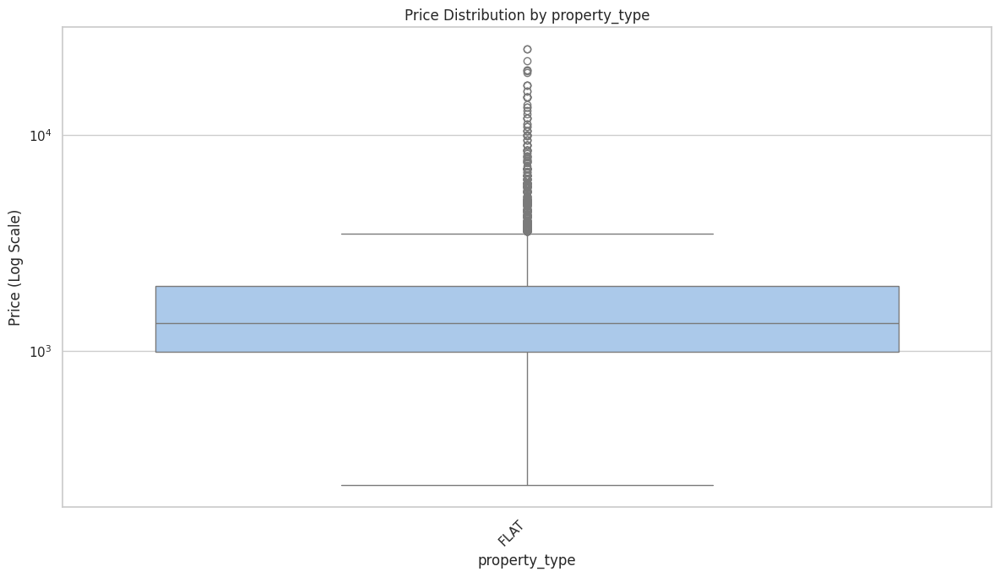

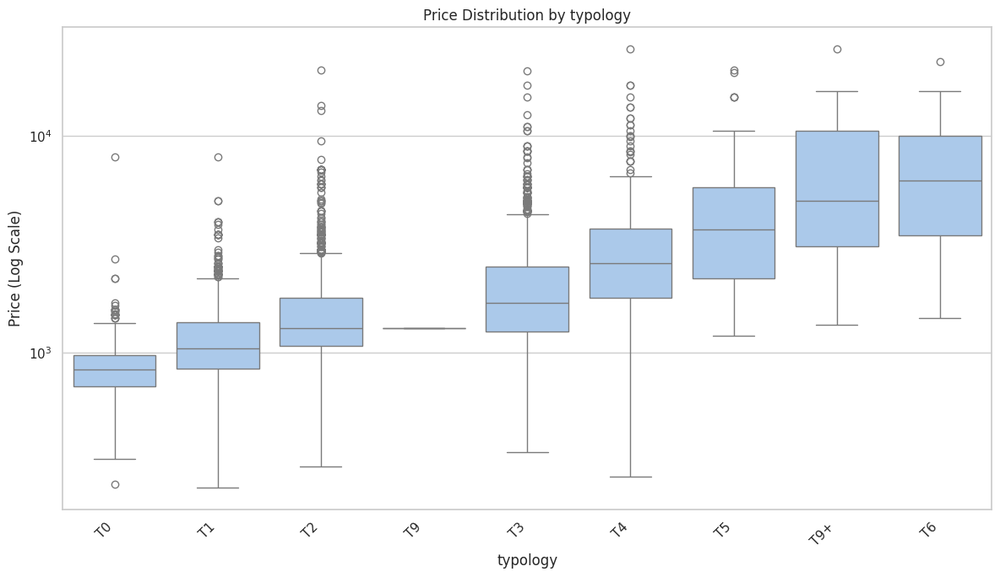

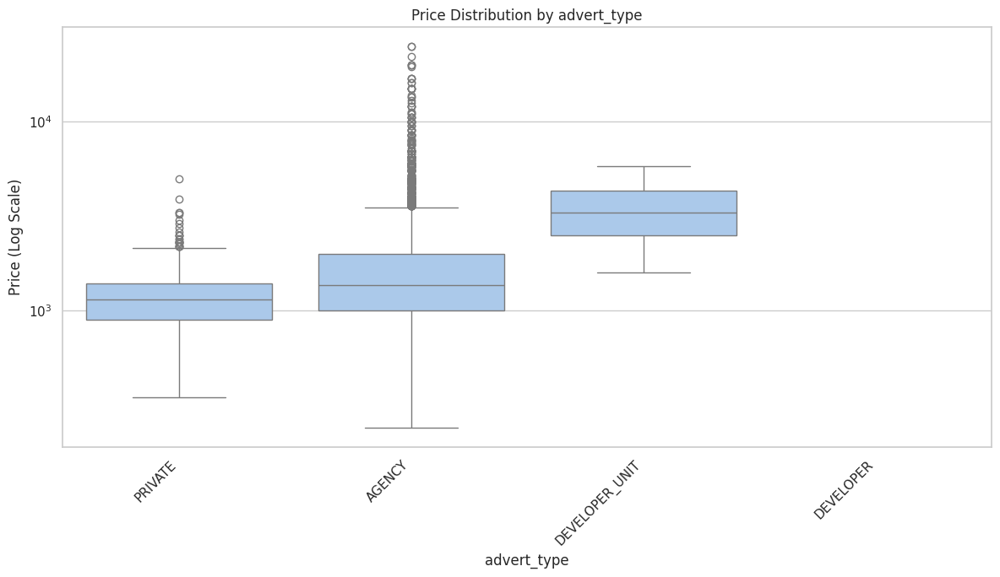

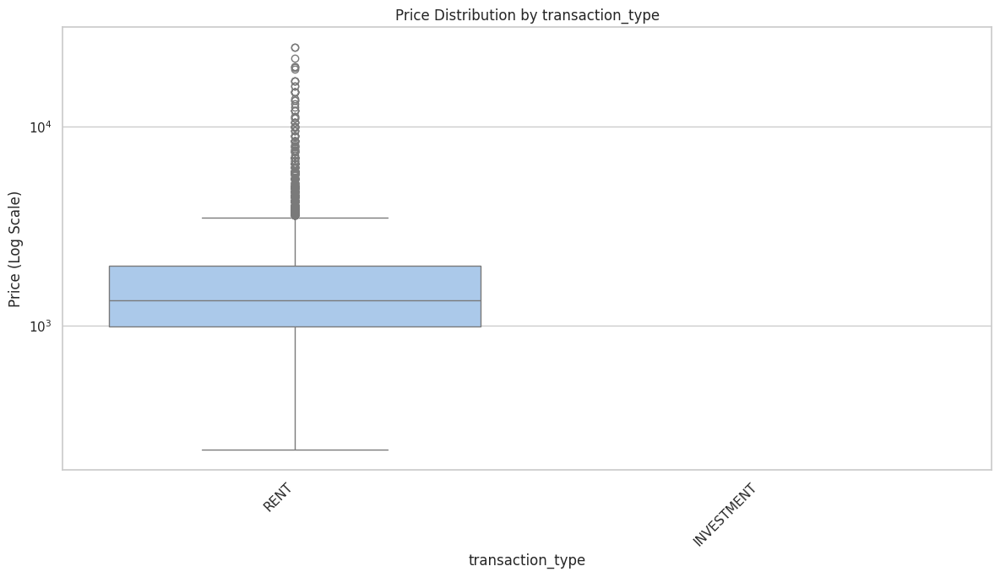

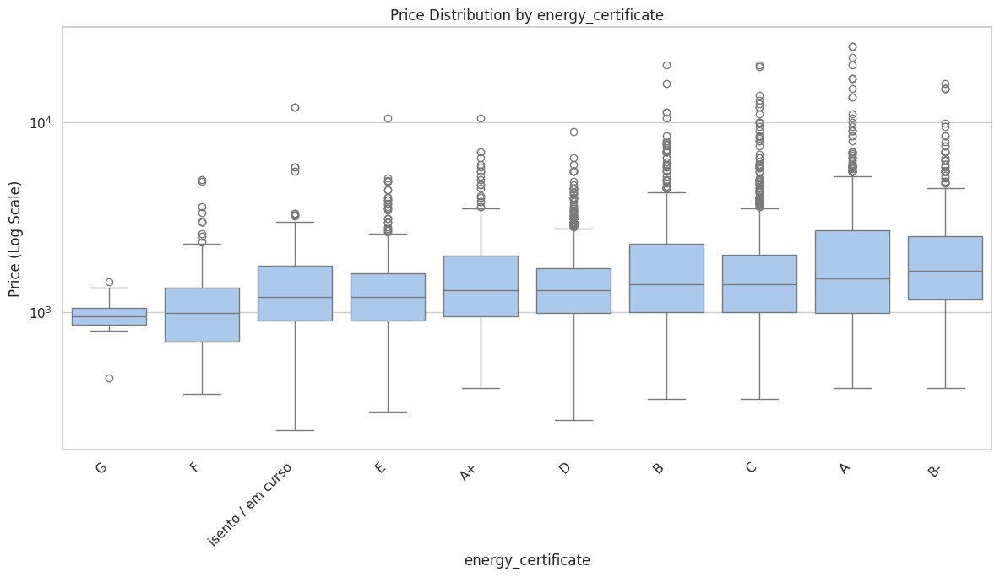

In [12]:
cat_vs_num_cols = ['property_type', 'typology', 'advert_type', 'transaction_type', 'energy_certificate']

if 'price' in df.columns:
    for col in cat_vs_num_cols:
        if col in df.columns and df[col].notna().sum() > 0 :
            plt.figure(figsize=(12, 7))
            order = df.groupby(col)['price'].median().sort_values().index
            sns.boxplot(data=df, x=col, y='price', order=order)
            plt.title(f'Price Distribution by {col}')
            plt.xlabel(col)
            plt.ylabel('Price (Log Scale)')
            plt.xticks(rotation=45, ha='right')
            plt.yscale('log')
            plt.tight_layout()
            plt.show()
else:
    print("'price' column not found for categorical vs numerical analysis.")

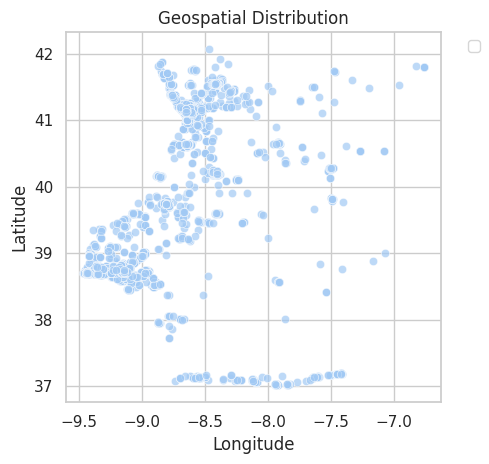


--- Generating Interactive Map with Plotly ---


/tmp/ipykernel_22946/2444762430.py:80: DeprecationWarning: *scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/
  fig = px.scatter_mapbox(df_map,


In [13]:
plot_subset_cols = ['latitude', 'longitude']
hue_col = None
size_col = None

if 'price_bin' in df.columns and df['price_bin'].notna().any():
    plot_subset_cols.append('price_bin')
    hue_col = 'price_bin'
if 'area_bin' in df.columns and df['area_bin'].notna().any():
    plot_subset_cols.append('area_bin')
    size_col = 'area_bin'

# Ensure price_labels and area_labels are defined if they are to be used,
# even if they are None (to avoid NameError later)
if 'price_labels' not in locals(): price_labels = None
if 'area_labels' not in locals(): area_labels = None

df_to_plot = df.dropna(subset=plot_subset_cols)

if not df_to_plot.empty:
    # --- MINIMAL CHANGES FOR LABEL INVERSION START HERE ---

    # Invert price_labels for hue_order if price_labels exists
    inverted_price_labels_for_hue = None
    if hue_col and hue_col == 'price_bin' and price_labels is not None:
        inverted_price_labels_for_hue = price_labels[::-1]

    # Invert area_labels for size_order if area_labels exists
    inverted_area_labels_for_size = None
    if size_col and size_col == 'area_bin' and area_labels is not None:
        inverted_area_labels_for_size = area_labels[::-1]

    sns.scatterplot(data=df_to_plot,
                    x='longitude',
                    y='latitude',
                    hue=hue_col,
                    size=size_col,
                    # Palette for Red (high) to Green (low) when hue_order is high to low
                    palette='RdYlGn' if hue_col else None,
                    alpha=0.7,
                    sizes=(30, 250) if size_col else None,
                    # Use the inverted lists for order
                    hue_order=inverted_price_labels_for_hue,
                    size_order=inverted_area_labels_for_size,
                    legend='auto')
    # --- MINIMAL CHANGES FOR LABEL INVERSION END HERE ---

    plt.title('Geospatial Distribution')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.grid(True)

    legend_title_parts = []
    if hue_col:
        legend_title_parts.append(f"Hue ({hue_col}):")
    if size_col:
        legend_title_parts.append(f"Size ({size_col}):")

    plt.legend(title="\n".join(legend_title_parts), bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout(rect=[0, 0, 0.80, 1]) # Adjusted rect for potentially larger legend
    plt.show()
else:
    print("No data to plot after processing bins and dropping NaNs from lat/lon.")



# --- Interactive Map with Plotly ---
print("\n--- Generating Interactive Map with Plotly ---")
required_cols_plotly = ['latitude', 'longitude', 'price', 'area_m2', 'title']
missing_cols = [col for col in required_cols_plotly if col not in df.columns]

if not missing_cols:
    # Drop rows where essential map data is missing
    df_map = df.dropna(subset=['latitude', 'longitude', 'price', 'area_m2', 'title']).copy()

    # Optional: Cap price and area_m2 for better visualization if they have extreme outliers
    if not df_map.empty:
        # df_map['price_viz'] = df_map['price'].clip(upper=df_map['price'].quantile(0.95)) # Cap price for color scale
        # df_map['area_m2_viz'] = df_map['area_m2'].clip(upper=df_map['area_m2'].quantile(0.95)) # Cap area for size scale

        fig = px.scatter_mapbox(df_map,
                                lat="latitude",
                                lon="longitude",
                                color="price", # Use original price or price_viz
                                size="area_m2",   # Use original area or area_m2_viz
                                color_continuous_scale=px.colors.cyclical.IceFire, # Or "viridis", "plasma"
                                size_max=20,  # Adjust marker size
                                zoom=13.5,       # Zoom level for Portugal
                                center={"lat": 38.72, "lon": -9.13}, # Center map on Portugal
                                hover_name="title", # Show property title on hover
                                hover_data={"price": ":.2f", "area_m2": ":.0f", "latitude":":.4f", "longitude":":.4f"}, # Additional hover info
                                mapbox_style="open-street-map", # Options: "carto-positron", "stamen-terrain", etc.
                                title="Property Locations and Prices in Portugal")
        fig.update_layout(margin={"r":0,"t":30,"l":0,"b":0}) # Adjust margins
        fig.show()
    else:
        print("No data available for map after dropping NaNs from essential columns (lat, lon, price, area_m2, title).")
else:
    print(f"Missing columns required for Plotly map: {missing_cols}. Cannot generate map.")

In [14]:
# Set a nicer global style for plots
sns.set_theme(style="whitegrid", palette="pastel")

# --- Define Lisbon & Porto ---
# Adjust these names if your 'address_district' column uses different identifiers
# For example, if you have county level, you might need a longer list.
LISBON_PORTO_DISTRICTS = ['Lisboa', 'Porto']

# Create a 'group' column for easier filtering and hue in plots
if 'address_district' in df.columns:
    df['market_group'] = df['address_district'].apply(
        lambda x: 'Lisbon & Porto' if x in LISBON_PORTO_DISTRICTS else 'Rest of Portugal'
    )

    df_lp = df[df['market_group'] == 'Lisbon & Porto'].copy()
    df_rest = df[df['market_group'] == 'Rest of Portugal'].copy()

    display(HTML(f"<h3>Data Split:</h3>"
                 f"<ul>"
                 f"<li>Lisbon & Porto Listings: {len(df_lp)}</li>"
                 f"<li>Rest of Portugal Listings: {len(df_rest)}</li>"
                 f"</ul>"))
else:
    display(HTML("<p style='color:red;'>Error: 'address_district' column not found. Cannot proceed with comparison.</p>"))
    # Create empty DFs to prevent errors later if you still want to run the structure
    df_lp = pd.DataFrame(columns=df.columns)
    df_rest = pd.DataFrame(columns=df.columns)
    df['market_group'] = 'Unknown' # Placeholder

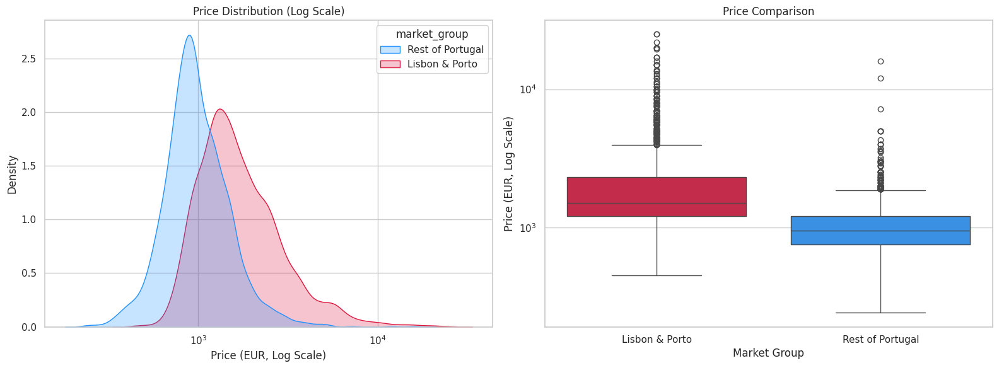

,count,mean,std,min,25%,50%,75%,max
market_group,,,,,,,,
Lisbon & Porto,4436.000000,2021.000000,1698.000000,450.000000,1200.000000,1500.000000,2300.000000,25000.000000
Rest of Portugal,1707.000000,1083.000000,699.000000,240.000000,750.000000,950.000000,1200.000000,16000.000000


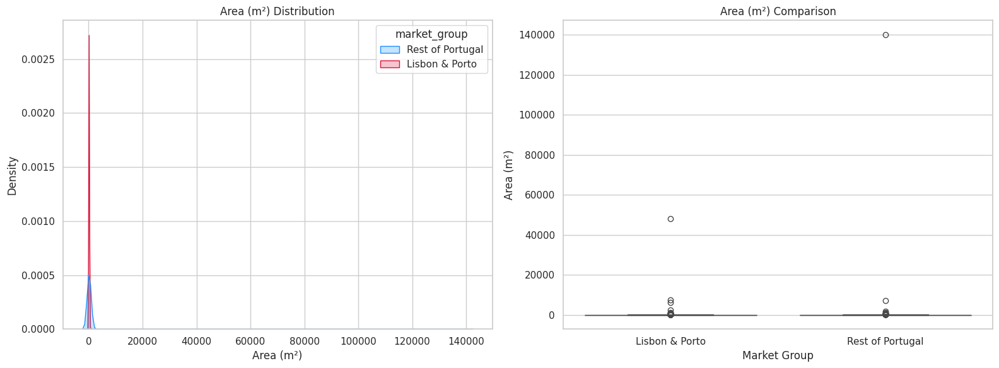

,count,mean,std,min,25%,50%,75%,max
market_group,,,,,,,,
Lisbon & Porto,4446.000000,112.200000,739.500000,1.000000,60.400000,89.000000,120.000000,48200.000000
Rest of Portugal,1714.000000,178.900000,3388.200000,1.000000,60.000000,87.000000,110.000000,140159.000000


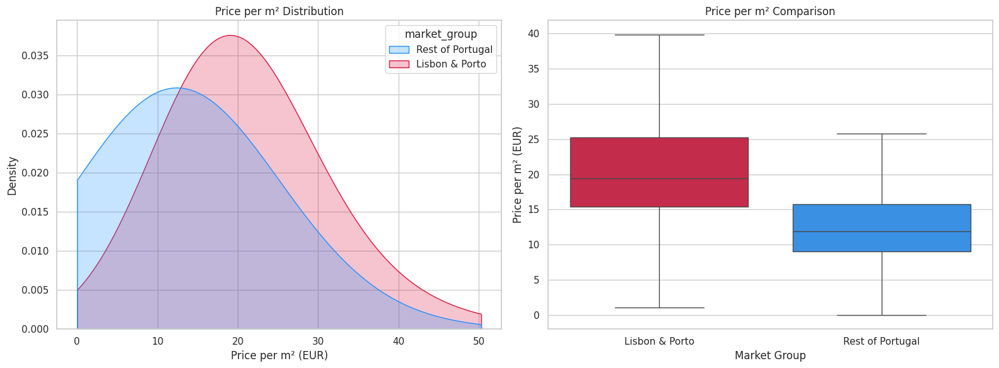

,count,mean,std,min,25%,50%,75%,max
market_group,,,,,,,,
Lisbon & Porto,4436.000000,22.600000,41.300000,0.000000,15.400000,19.400000,25.200000,2000.000000
Rest of Portugal,1707.000000,16.000000,51.900000,0.000000,9.000000,11.900000,15.800000,1150.000000


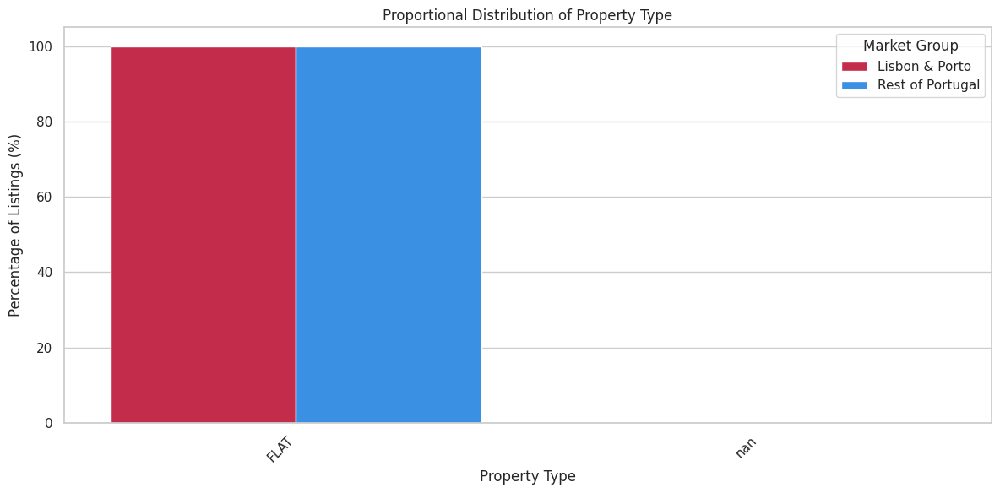

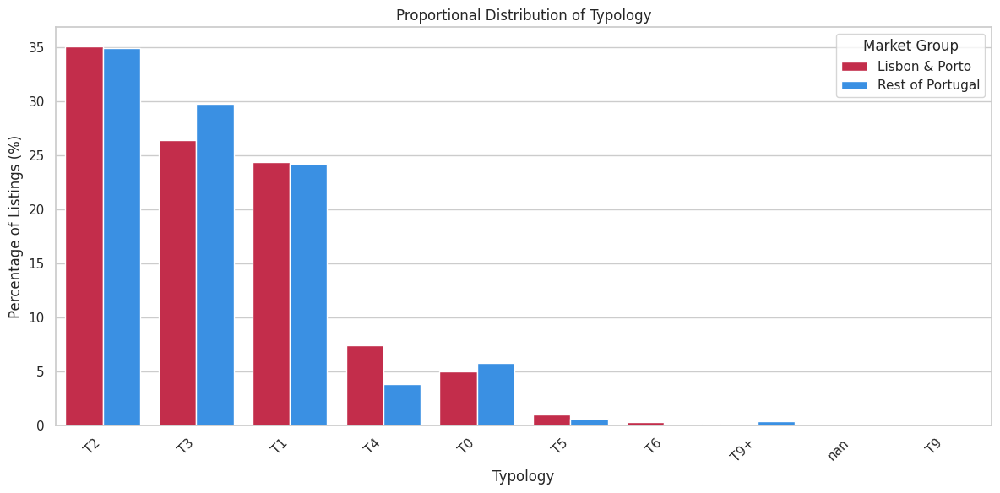

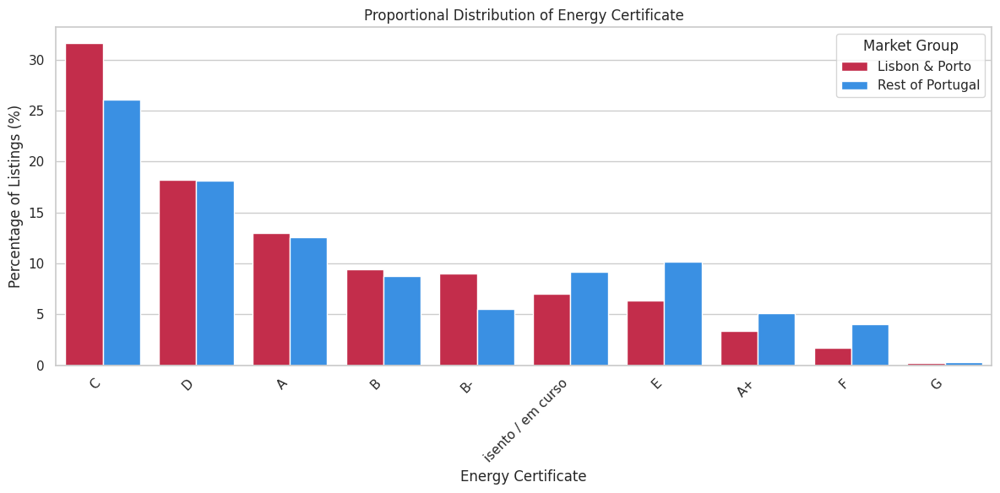

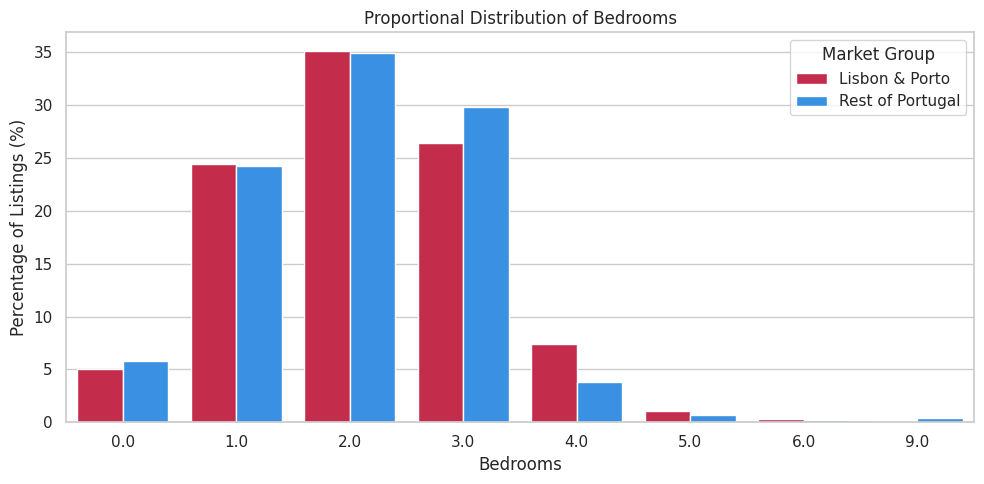

,mean,25%,50%,75%
market_group,,,,
Lisbon & Porto,2.100000,1.000000,2.000000,3.000000
Rest of Portugal,2.100000,1.000000,2.000000,3.000000


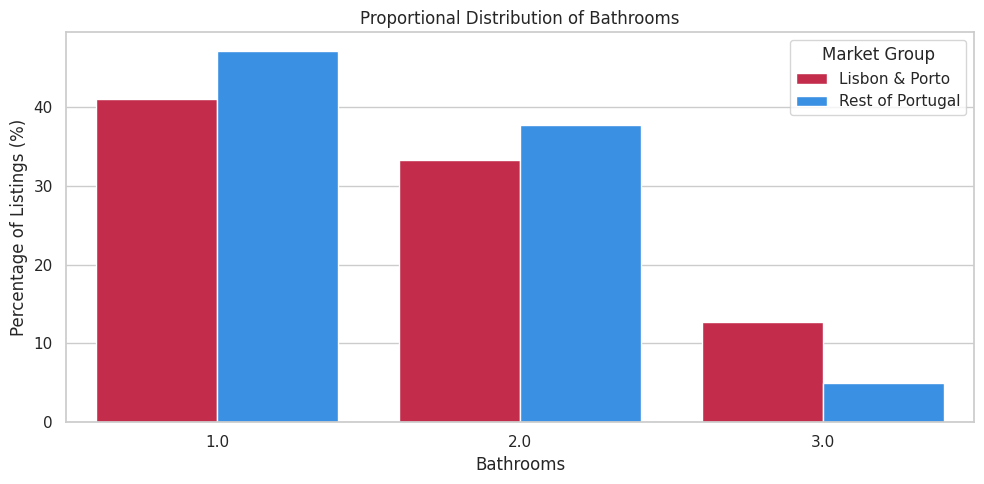

,mean,25%,50%,75%
market_group,,,,
Lisbon & Porto,1.700000,1.000000,2.000000,2.000000
Rest of Portugal,1.500000,1.000000,1.000000,2.000000


In [15]:
if 'market_group' in df.columns and len(df_lp) > 0 and len(df_rest) > 0:
    display(HTML("<h2>Comparative Analysis: Lisbon & Porto vs. Rest of Portugal</h2>"))

    # --- 2.1 Price Comparison ---
    display(HTML("<h3>Price Analysis</h3>"))
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    # KDE Plot for Price (Log Scale for better visibility)
    sns.kdeplot(data=df, x='price', hue='market_group', fill=True, common_norm=False, log_scale=True, ax=axes[0], palette={'Lisbon & Porto': 'crimson', 'Rest of Portugal': 'dodgerblue'})
    axes[0].set_title('Price Distribution (Log Scale)')
    axes[0].set_xlabel('Price (EUR, Log Scale)')
    # Box Plot for Price (Log Scale)
    sns.boxplot(data=df, y='price', x='market_group', ax=axes[1], palette={'Lisbon & Porto': 'crimson', 'Rest of Portugal': 'dodgerblue'}, order=['Lisbon & Porto', 'Rest of Portugal'])
    axes[1].set_yscale('log')
    axes[1].set_title('Price Comparison')
    axes[1].set_ylabel('Price (EUR, Log Scale)')
    axes[1].set_xlabel('Market Group')
    plt.tight_layout()
    plt.show()

    price_summary = df.groupby('market_group')['price'].describe().round(0)
    display(HTML("<h4>Price Summary Statistics:</h4>"))
    display(price_summary.style.set_caption("Price Summary by Market Group"))


    # --- 2.2 Area (m²) Comparison ---
    display(HTML("<h3>Area (m²) Analysis</h3>"))
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    # KDE Plot for Area
    sns.kdeplot(data=df, x='area_m2', hue='market_group', fill=True, common_norm=False, ax=axes[0], palette={'Lisbon & Porto': 'crimson', 'Rest of Portugal': 'dodgerblue'})
    axes[0].set_title('Area (m²) Distribution')
    axes[0].set_xlabel('Area (m²)')
    # Box Plot for Area
    sns.boxplot(data=df, y='area_m2', x='market_group', ax=axes[1], palette={'Lisbon & Porto': 'crimson', 'Rest of Portugal': 'dodgerblue'}, order=['Lisbon & Porto', 'Rest of Portugal'])
    axes[1].set_title('Area (m²) Comparison')
    axes[1].set_ylabel('Area (m²)')
    axes[1].set_xlabel('Market Group')
    plt.tight_layout()
    plt.show()

    area_summary = df.groupby('market_group')['area_m2'].describe().round(1)
    display(HTML("<h4>Area (m²) Summary Statistics:</h4>"))
    display(area_summary.style.set_caption("Area (m²) Summary by Market Group"))


    # --- 2.3 Price per Square Meter Comparison ---
    if 'price' in df.columns and 'area_m2' in df.columns:
        df_temp_ppm2 = df.copy() # Avoid SettingWithCopyWarning
        df_temp_ppm2['price_per_m2'] = df_temp_ppm2['price'] / df_temp_ppm2['area_m2']
        df_temp_ppm2.dropna(subset=['price_per_m2'], inplace=True) # Drop if price or area was NaN

        display(HTML("<h3>Price per m² Analysis</h3>"))
        fig, axes = plt.subplots(1, 2, figsize=(16, 6))
        sns.kdeplot(data=df_temp_ppm2, x='price_per_m2', hue='market_group', fill=True, common_norm=False, log_scale=False, ax=axes[0], palette={'Lisbon & Porto': 'crimson', 'Rest of Portugal': 'dodgerblue'}, clip=(0, df_temp_ppm2['price_per_m2'].quantile(0.99))) # Clip outliers for KDE
        axes[0].set_title('Price per m² Distribution')
        axes[0].set_xlabel('Price per m² (EUR)')

        sns.boxplot(data=df_temp_ppm2, y='price_per_m2', x='market_group', ax=axes[1], palette={'Lisbon & Porto': 'crimson', 'Rest of Portugal': 'dodgerblue'}, order=['Lisbon & Porto', 'Rest of Portugal'], showfliers=False) # Hide outliers for boxplot focus
        axes[1].set_title('Price per m² Comparison')
        axes[1].set_ylabel('Price per m² (EUR)')
        axes[1].set_xlabel('Market Group')
        plt.tight_layout()
        plt.show()

        ppm2_summary = df_temp_ppm2.groupby('market_group')['price_per_m2'].describe().round(1)
        display(HTML("<h4>Price per m² Summary Statistics:</h4>"))
        display(ppm2_summary.style.set_caption("Price per m² Summary by Market Group"))
        del df_temp_ppm2 # Clean up


    # --- 2.4 Categorical Characteristics Comparison (Property Type, Typology) ---
    display(HTML("<h3>Property Characteristics Comparison</h3>"))
    categorical_characteristics = ['property_type', 'typology', 'energy_certificate'] # Add more as needed
    MAX_CATEGORIES_FOR_PLOT = 10

    for char_col in categorical_characteristics:
        if char_col in df.columns:
            display(HTML(f"<h4>Comparison of: {char_col.replace('_', ' ').title()}</h4>"))

            # Calculate proportions for bar plot
            prop_df = df.groupby('market_group')[char_col].value_counts(normalize=True, dropna=False).mul(100).rename('percentage').reset_index()

            # Limit to top N categories overall for cleaner plot if too many
            top_categories = df[char_col].value_counts(dropna=False).nlargest(MAX_CATEGORIES_FOR_PLOT).index
            prop_df_filtered = prop_df[prop_df[char_col].isin(top_categories)]

            plt.figure(figsize=(12, 6))
            sns.barplot(data=prop_df_filtered, x=char_col, y='percentage', hue='market_group', palette={'Lisbon & Porto': 'crimson', 'Rest of Portugal': 'dodgerblue'}, order=top_categories.tolist()) # Use top_categories for order
            plt.title(f'Proportional Distribution of {char_col.replace("_", " ").title()}')
            plt.ylabel('Percentage of Listings (%)')
            plt.xlabel(char_col.replace("_", " ").title())
            plt.xticks(rotation=45, ha='right')
            plt.legend(title='Market Group')
            plt.tight_layout()
            plt.show()

    # --- 2.5 Numerical Discrete Characteristics (Bedrooms, Bathrooms) ---
    display(HTML("<h3>Room Counts Comparison</h3>"))
    numerical_discrete_chars = ['bedrooms', 'bathrooms']

    for char_col in numerical_discrete_chars:
        if char_col in df.columns:
            # Ensure the column is treated as category for countplot if it's Int64 or float with few uniques
            df_plot_temp = df.copy()
            df_plot_temp[char_col] = df_plot_temp[char_col].astype('category')

            display(HTML(f"<h4>Comparison of: {char_col.replace('_', ' ').title()}</h4>"))
            prop_df = df_plot_temp.groupby('market_group')[char_col].value_counts(normalize=True, dropna=False).mul(100).rename('percentage').reset_index()

            # Order categories for the plot
            cat_order = sorted(df_plot_temp[char_col].unique().dropna().tolist())


            plt.figure(figsize=(10, 5))
            sns.barplot(data=prop_df, x=char_col, y='percentage', hue='market_group', palette={'Lisbon & Porto': 'crimson', 'Rest of Portugal': 'dodgerblue'}, order=cat_order)
            plt.title(f'Proportional Distribution of {char_col.replace("_", " ").title()}')
            plt.ylabel('Percentage of Listings (%)')
            plt.xlabel(char_col.replace("_", " ").title())
            plt.legend(title='Market Group')
            plt.tight_layout()
            plt.show()

            # Summary stats for bedrooms/bathrooms
            room_summary = df.groupby('market_group')[char_col].describe(percentiles=[.25, .5, .75]).drop(columns=['count', 'std', 'min', 'max']).round(1) # Focus on quartiles
            display(HTML(f"<h5>Summary for {char_col.replace('_', ' ').title()}:</h5>"))
            display(room_summary.style.set_caption(f"{char_col.replace('_', ' ').title()} Summary"))


else:
    display(HTML("<p style='color:orange;'>Warning: Could not perform comparative analysis. Check if 'market_group' was created and if both groups have data.</p>"))

In [16]:
# --- Calculate Median Prices by Typology for Lisbon and Porto ---
if 'address_district' in df_lp.columns and 'typology' in df_lp.columns and 'price' in df_lp.columns:
    # Filter for Lisbon and Porto explicitly if df_lp contains more than just these two
    # (though df_lp should already be filtered)
    df_lisbon = df_lp[df_lp['address_district'] == 'Lisboa'].copy()
    df_porto = df_lp[df_lp['address_district'] == 'Porto'].copy()

    # Calculate median price - median is often more robust to outliers than mean for prices
    median_price_lisbon_typology = df_lisbon.groupby('typology')['price'].median().round(0)
    median_price_porto_typology = df_porto.groupby('typology')['price'].median().round(0)

    # Count of listings for context
    count_lisbon_typology = df_lisbon.groupby('typology')['price'].count()
    count_porto_typology = df_porto.groupby('typology')['price'].count()

    # Combine into a single DataFrame for display
    typology_price_comparison = pd.DataFrame({
        'Typology': median_price_lisbon_typology.index,
        'Lisbon Median Price (€)': median_price_lisbon_typology.values,
        'Lisbon Listings Count': count_lisbon_typology.reindex(median_price_lisbon_typology.index).values
    }).set_index('Typology')

    porto_df_temp = pd.DataFrame({
        'Typology': median_price_porto_typology.index,
        'Porto Median Price (€)': median_price_porto_typology.values,
        'Porto Listings Count': count_porto_typology.reindex(median_price_porto_typology.index).values
    }).set_index('Typology')

    typology_price_comparison = typology_price_comparison.join(porto_df_temp, how='outer').fillna(0) # Fill NaN with 0 for counts/prices if a typology is missing in one city

    # Ensure integer types for display where appropriate
    for col in ['Lisbon Median Price (€)', 'Porto Median Price (€)', 'Lisbon Listings Count', 'Porto Listings Count']:
        if col in typology_price_comparison.columns:
            typology_price_comparison[col] = typology_price_comparison[col].astype(int)


    # Sort by a typical typology order if possible (T0, T1, T2...)
    # Create a custom sort order for typologies
    typology_order = [f'T{i}' for i in range(10)] + [f'T{i}+' for i in range(10)] + ['T10+','Estúdio', 'Outro'] # Add more common typologies if needed
    # Convert index to Categorical with the defined order
    typology_price_comparison.index = pd.Categorical(typology_price_comparison.index, categories=typology_order, ordered=True)
    typology_price_comparison = typology_price_comparison.sort_index()

    # Reset index to make 'Typology' a column again for styling
    typology_price_comparison.reset_index(inplace=True)


    display(HTML("<h3>Median Housing Prices by Typology: Lisbon vs. Porto</h3>"))
    # Style the DataFrame
    styled_table = typology_price_comparison.style.set_caption("Median Property Prices (€) and Listing Counts by Typology") \
        .format({
            'Lisbon Median Price (€)': "€{:,.0f}",
            'Porto Median Price (€)': "€{:,.0f}",
            'Lisbon Listings Count': "{:,.0f}",
            'Porto Listings Count': "{:,.0f}"
        }) \
        .set_properties(**{'text-align': 'right', 'min-width': '100px'}) \
        .set_table_styles([
            {'selector': 'th', 'props': [('text-align', 'center'), ('font-weight', 'bold')]},
            {'selector': 'td, th', 'props': [('border', '1px solid #ddd')]},
            {'selector': 'caption', 'props': [('caption-side', 'top'), ('font-size', '1.1em'), ('font-weight', 'bold'), ('margin-bottom', '10px')]}
        ]) \
        .bar(subset=['Lisbon Median Price (€)', 'Porto Median Price (€)'], color='#5dade2', vmin=0, align='zero') \
        .hide(axis="index") # Hide the default numerical index

    display(styled_table)

else:
    display(HTML("<p style='color:orange;'>Warning: Could not generate typology price table. Required columns ('address_district', 'typology', 'price') not found in df_lp or df_lp is empty.</p>"))

index,Lisbon Median Price (€),Lisbon Listings Count,Porto Median Price (€),Porto Listings Count
T0,€980,87,€850,136
T1,"€1,350",636,€998,448
T2,"€1,650","1,140","€1,250",420
T3,"€2,200",840,"€1,650",335
T4,"€3,000",241,"€2,400",87
T5,"€4,500",43,"€2,000",3
T6,"€7,000",14,€0,0
T9,"€1,300",1,€0,0
T9+,€0,0,"€7,500",5
